In [1]:
%%html
<link rel="stylesheet" type="text/css" href="rise.css" />

In [2]:
import numpy as np

import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'
plt.style.use("bmh")
plt.rcParams["axes.labelsize"] = 14
plt.rcParams["axes.titlesize"] = 16
plt.rcParams["xtick.labelsize"] = 12
plt.rcParams["ytick.labelsize"] = 12
plt.rcParams["legend.fontsize"] = 12
plt.rcParams["lines.linewidth"] = 1
plt.rcParams["figure.figsize"] = 10, 4

# Sequences, sampling, filtering & convolution
**Learning goals**
- You will apreciate the difference between a random variable and a data sequence.
- You will be able to compute the autocorrelation of a sequence.
- You will appreciate that random variables are uncorrelated, whereas sequence data may not be.
- You will be appreciate how undersampling results in artifacts.
- You will appreciate the Fourier transform representation of a 1-D signal.
- You will be able to visualize the frequency power spectrum of a 1-D signal.
- You will be able to visualize the frequency spectrogram of a 1-D signal.
- You will understand why convolution describes a systems output based on its impulse response.
- You will understand the convolution of discrete arrays.
- You will be able to convolve two arrays.
- You will appreciate how convolution can be used to filter a sequence.
- You will be able to apply lowpass, highpass and bandpass finite impulse response (FIR) filters to a data sequence.
- You will be able to properly downsample a data sequence without introducing alisasing artifacts.
- You will be able to convolve an image with a 2D kernel.
- You will appreciate that convolution can be used to highlight features in an image.
- You will appreciate that the joint probability distribution resulting from adding two random variables is the convolution of their individual probability distributions.

Compare an EEG time series with normally distributed random values. What is different?

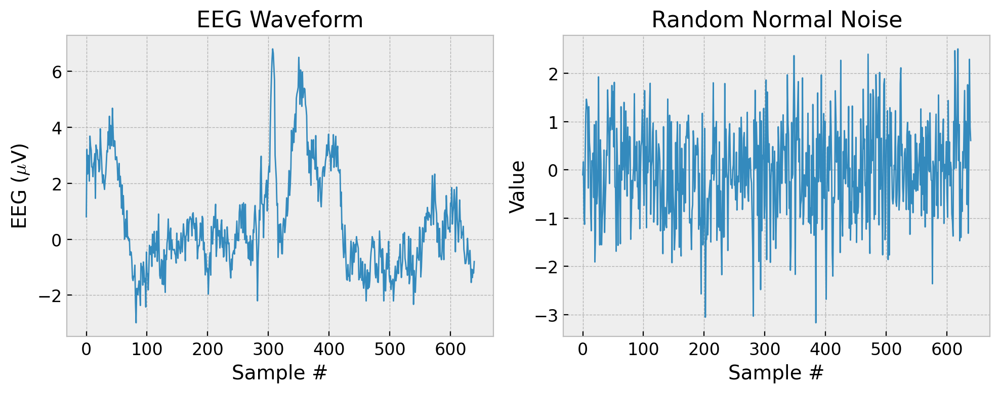

In [3]:
eeg = np.loadtxt('data/EEG.txt')

noise = np.random.randn(len(eeg))

# EEG time series vs. random independent values
plt.subplot(1, 2, 1)
plt.plot(eeg)
plt.xlabel('Sample #')
plt.ylabel(r'EEG ($\mu$V)')
plt.title('EEG Waveform')
plt.subplot(1, 2, 2)
plt.plot(noise)
plt.xlabel('Sample #')
plt.ylabel('Value')
plt.title('Random Normal Noise')
plt.tight_layout();

### Autocorrelation

Correlation of a waveform with itself, but shifted in time.

First consider a simple sinusoidal waveform with some added noise for fun.

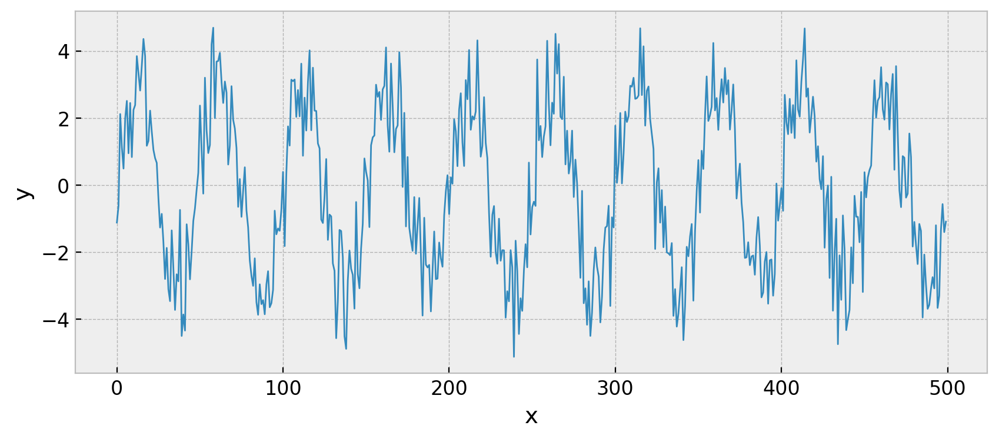

In [4]:
x = np.arange(500)
y = 3 * np.sin(2 * np.pi * 1/50 * x) + np.random.randn(500)

plt.plot(x, y)
plt.xlabel('x')
plt.ylabel('y');

Now imagine taking an exact copy of the waveform and sliding it along the x axis with respect to the original waveform, each step of the way computing how similar the shifted waveform is to the original.

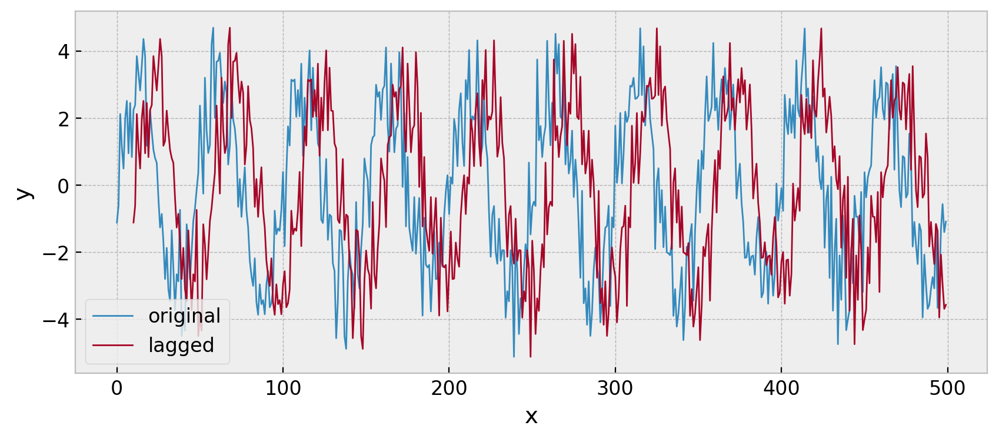

In [5]:
plt.plot(x, y, label='original')
plt.plot(x[10:], y[:-10], label='lagged')
plt.xlabel('x')
plt.ylabel('y')
plt.legend();

[StatsModels](https://www.statsmodels.org/stable/index.html)

```
pip install statsmodels
```

In [6]:
# tsa = time series analysis
from statsmodels.api import tsa

In [7]:
# correlation of waveform with itself for lags from 0-499 time points
autocorrelation = tsa.acf(y, nlags=500)

```shell
pip install ipywidgets
```
!!! Reboot Jupyter Lab after installing `ipywidgets` or widgets may not work.

In [8]:
# pip install ipywidgets
from ipywidgets import interact, IntSlider, Layout

def visualize_autocorrelation():
    x = np.arange(500)
    y = 3 * np.sin(2 * np.pi * 1/50 * x) + np.random.randn(500)
    
    autocorrelation = tsa.acf(y, nlags=500)

    def update_plot(lag):
        plt.figure(figsize=[10,6])
        plt.subplot(2,1,1)
        plt.plot(x, y, label='original')
        if lag > 0:
            plt.plot(x[lag:], y[:-lag], label='lagged')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.legend()
        plt.subplot(2,1,2)
        plt.plot(autocorrelation)
        plt.plot(lag, autocorrelation[lag], 'mo')
        plt.xlabel('Lag (samples)')
        plt.ylabel('Autocorrelation')
        plt.tight_layout();

    lag_slider = IntSlider(value=0, min=0, max=499, step=1, description='lag', layout=Layout(width='100%'))
    interact(update_plot, lag=lag_slider);

In [9]:
visualize_autocorrelation()

interactive(children=(IntSlider(value=0, description='lag', layout=Layout(width='100%'), max=499), Output()), …

Let's compare the autocorrelation of the EEG waveform and normally distributed random values from earlier.

In [10]:
npts = len(eeg)
acf_eeg = tsa.acf(eeg, nlags=npts)
acf_noise = tsa.acf(noise, nlags=npts)

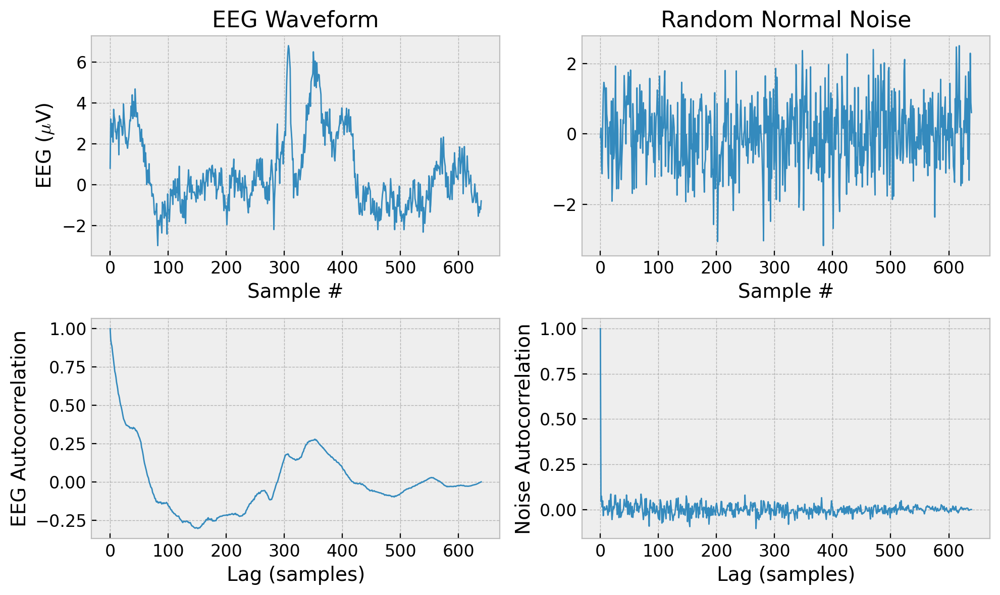

In [11]:
# autocorrlation of EEG waveform and random values
plt.figure(figsize=[10,6])
plt.subplot(2, 2, 1)
plt.plot(eeg)
plt.xlabel('Sample #')
plt.ylabel(r'EEG ($\mu$V)')
plt.title('EEG Waveform')
plt.subplot(2, 2, 2)
plt.plot(noise)
plt.xlabel('Sample #')
plt.title('Random Normal Noise')
plt.subplot(2, 2, 3)
plt.plot(acf_eeg)
plt.xlabel('Lag (samples)')
plt.ylabel('EEG Autocorrelation')
plt.subplot(2, 2, 4)
plt.plot(acf_noise)
plt.xlabel('Lag (samples)')
plt.ylabel('Noise Autocorrelation')
plt.tight_layout();

### Sampling & aliasing

Consider a simple sinusoidal waveform at a single frequency.

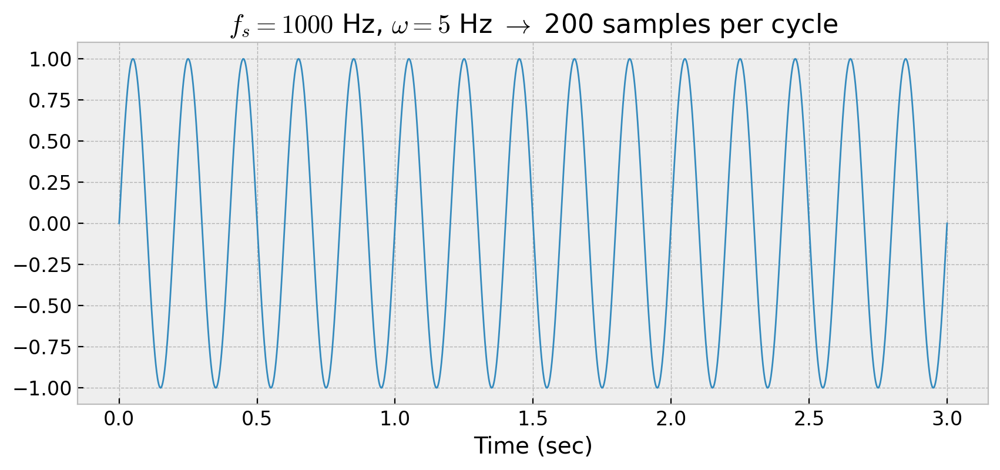

In [12]:
# 1000 samples per second
sampleFreq_Hz = 1000

# time between samples is 0.001 sec
dt_sec = 1 / sampleFreq_Hz

# array of time points from 0 to 3 sec at the sample rate
time_sec = np.arange(0, 3 + dt_sec, dt_sec)

# 5 cycles per second --> each cycle takes 0.2 sec
cycleFreq_Hz = 5

# sinusoidal waveform
waveform = np.sin(2 * np.pi * cycleFreq_Hz * time_sec)

plt.plot(time_sec, waveform)
plt.xlabel('Time (sec)')
plt.title(r'$f_s = 1000$ Hz, $\omega = 5$ Hz $\rightarrow$ 200 samples per cycle');

Now let's examine what your measured waveform would be if you sampled less frequently...

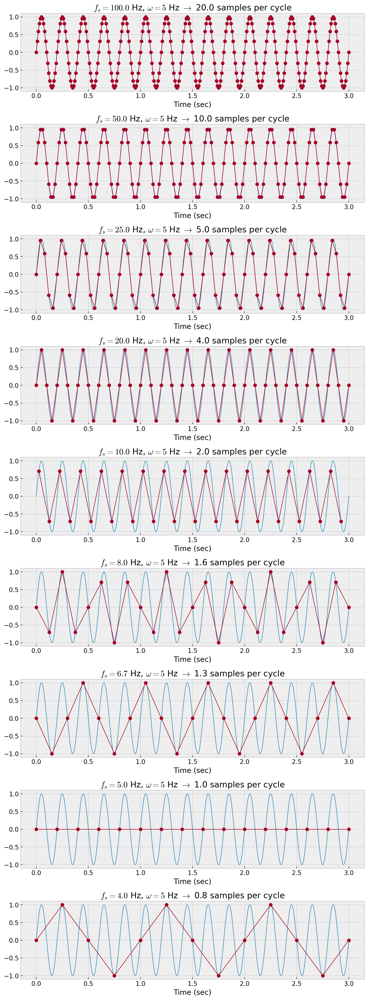

In [13]:
everyNthPoint = [10, 20, 40, 50, 100, 125, 150, 200, 250]
n_plots = len(everyNthPoint)
plt.figure(figsize=[10,3*n_plots])
for i, everyN in enumerate(everyNthPoint):
    plt.subplot(n_plots, 1, i+1)
    plt.plot(time_sec, waveform)
    if everyN == 100:
        plt.plot(time_sec[25::everyN], waveform[25::everyN], 'o-')
    else:
        plt.plot(time_sec[::everyN], waveform[::everyN], 'o-')
    plt.xlabel('Time (sec)')
    plt.title(rf'$f_s = {1000 / everyN :.1f}$ Hz, $\omega = 5$ Hz $\rightarrow$ {200 / everyN :.1f} samples per cycle')
plt.tight_layout();

### Aliasing

Undersampling results in a low frequency alias artifact.

**!!! This is much worse than just missing the higher frequencies because you get artifactual lower frequencies.**

### Nyquist frequency

Minimum frequency that can be resolved in a signal is one half the sample frequency.

### Exercise

You are going to record oscillations in membrane potential from a single neuron. You expect that the neruon will exhibit oscillations at both theta (~10 Hz) and gamma frequencies up to 80 Hz. What is the minimum sample rate necessary to resolve these oscillations?

### Exercise key

You are going to record oscillations in membrane potential from a single neuron. You expect that the neruon will exhibit oscillations at both theta (~10 Hz) and gamma frequencies up to 80 Hz. What is the minimum sample rate necessary to resolve these oscillations?

160 Hz

Consider a waveform with both 10 Hz and 80 Hz oscillations sampled at either 1000 Hz or 50 Hz.

Notice the emergence of an artifactual frequency when sampled at 50 Hz.

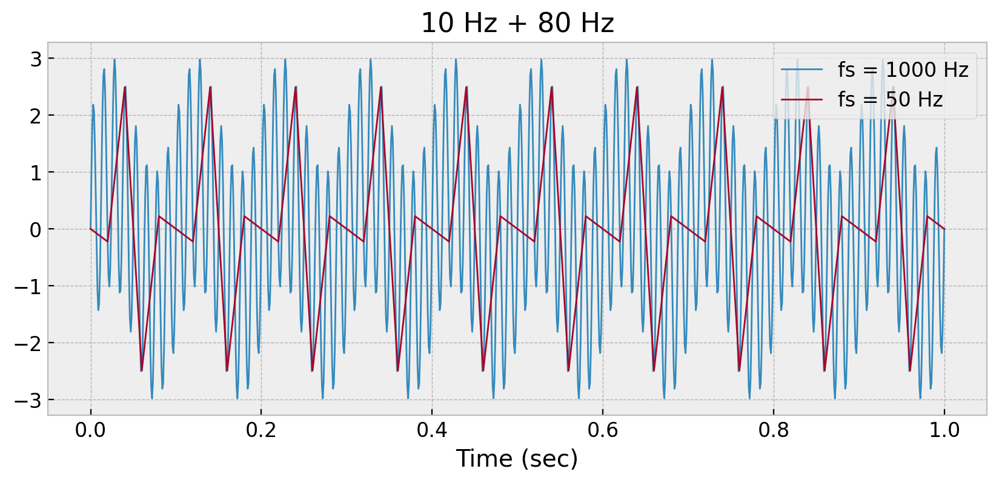

In [14]:
for fs_Hz in [1000, 50]:
    dt_sec = 1.0 / fs_Hz
    time_sec = np.arange(0, 1.001, dt_sec)
    waveform = np.sin(2 * np.pi * 10 * time_sec) + 2 * np.sin(2 * np.pi * 80 * time_sec)
    plt.plot(time_sec, waveform, label=f"fs = {fs_Hz} Hz")
plt.xlabel('Time (sec)')
plt.title('10 Hz + 80 Hz')
plt.legend();

### Fourier Transform

- Describe any waveform as the summation of simple sinusoidal signals at various frequencies.
- The Fourier transform of a waveform tells us how much of each frequency component is in the waveform.
- It converts a time domain waveform to a frequency domain signal.
- It is invertable, so we can also convert back from frequency to time domains.
- The concept is also valid for space and spatial frequencies.

<img src="images/fourier-comps.png" width="70%">

Any waveform, even a square pulse, can be built out of sinusoidal signals of varying amplitude and frequency.

<img src="images/fourier-rect-comps.png" width="70%">

Consider a waveform with both 10 Hz and 80 Hz oscillations sampled at 1 kHz.

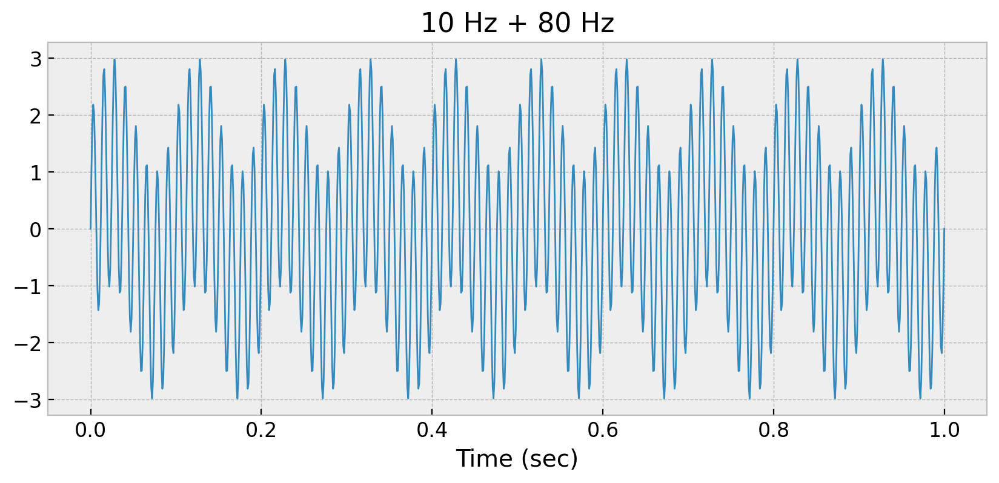

In [15]:
time_sec = np.arange(0, 1.001, 0.001)
waveform = np.sin(2 * np.pi * 10 * time_sec) + 2 * np.sin(2 * np.pi * 80 * time_sec)
plt.plot(time_sec, waveform)
plt.xlabel('Time (sec)')
plt.title('10 Hz + 80 Hz');

Use a Fast Fourier Transform (FFT) to see how much of which frequencies are in the waveform.

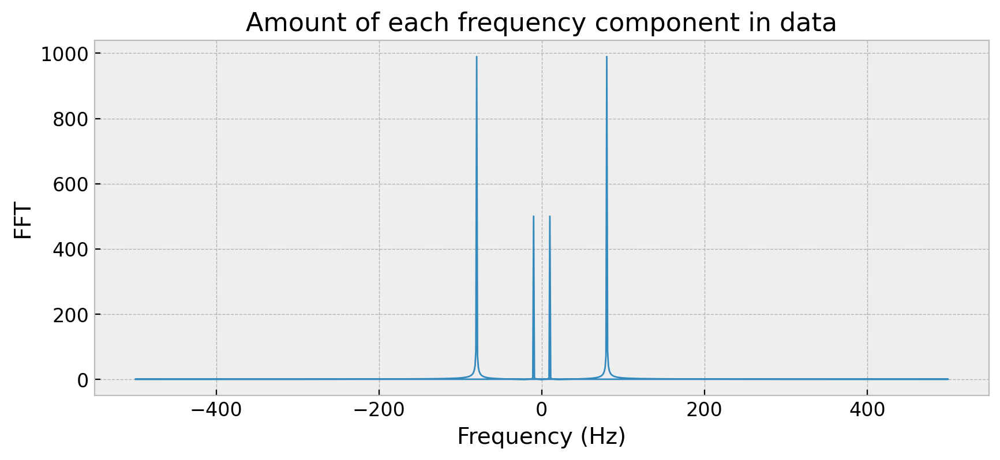

In [16]:
# amount of each frequency component in the time series
fft = np.fft.fft(waveform)

# the frequencies corresponding to the amounts in fft above
# !!! pay attention to units!
sampleInterval_sec = 0.001  # for 1 kHz sample rate
freq_Hz = np.fft.fftfreq(len(fft), sampleInterval_sec)

plt.plot(freq_Hz, np.abs(fft))
plt.xlabel('Frequency (Hz)')
plt.ylabel('FFT')
plt.title('Amount of each frequency component in data');

Note that the frequency range goes up to the Nyquist frequency, but not beyond.

For real inputs, positive and negative frequency components are symmetrical.

So typically you just look at positive frequencies up to the Nyquist frequency.

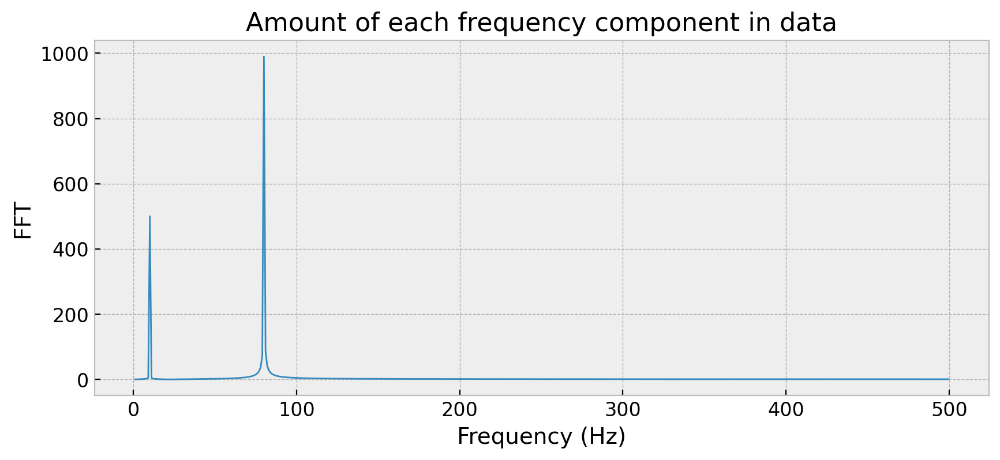

In [17]:
pos = (freq_Hz > 0)

plt.plot(freq_Hz[pos], np.abs(fft[pos]))
plt.xlabel('Frequency (Hz)')
plt.ylabel('FFT')
plt.title('Amount of each frequency component in data');

Inverse FFT returns to original time series.

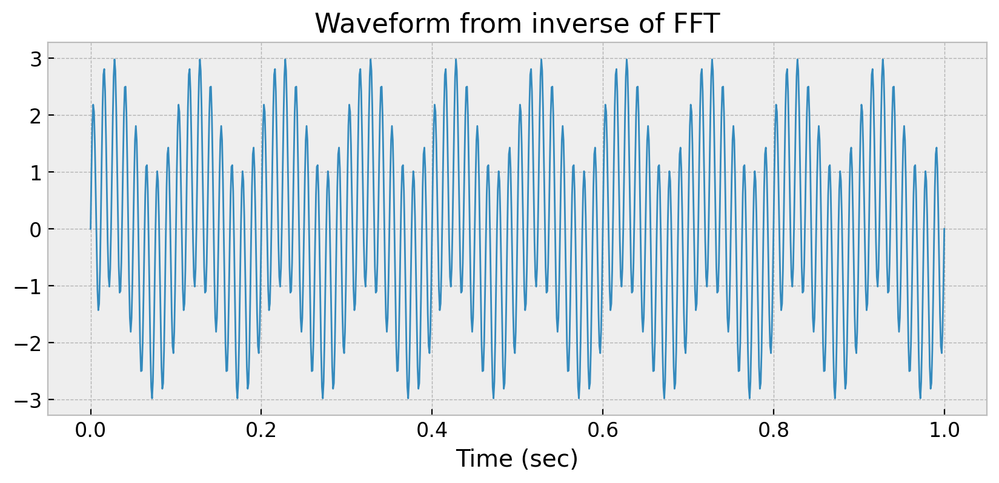

In [18]:
waveformFromFFT = np.real(np.fft.ifft(fft))

plt.plot(time_sec, waveformFromFFT)
plt.xlabel('Time (sec)')
plt.title('Waveform from inverse of FFT');

Because it is invertible, FFT is useful for manipulating the frequency components in a signal.

Let's remove the 80 Hz component by zeroing it out in the frequency domain.

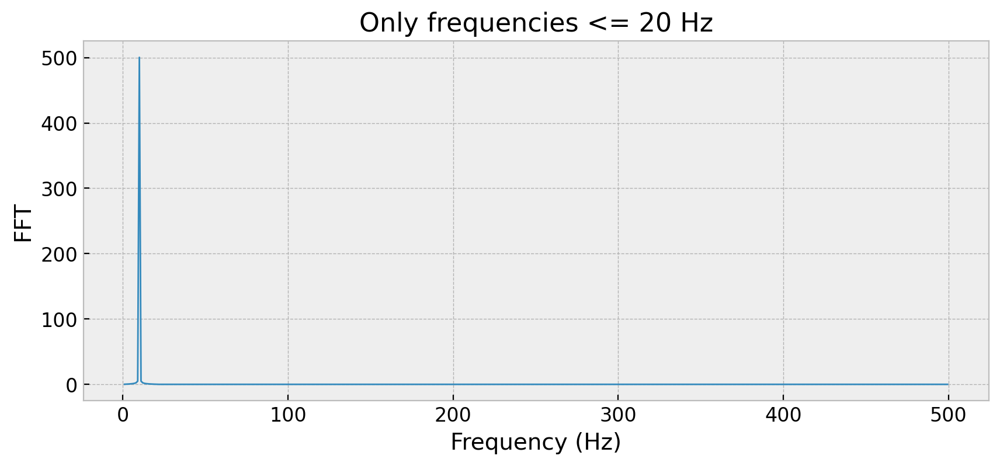

In [19]:
# so we don't do anything to our original fft
fft_20_or_less = fft.copy()

# remove all frequencies above 20 Hz (i.e. the 80 Hz component)
high = np.abs(freq_Hz) > 20
fft_20_or_less[high] = 0

plt.plot(freq_Hz[pos], np.abs(fft_20_or_less[pos]))
plt.xlabel('Frequency (Hz)')
plt.ylabel('FFT')
plt.title('Only frequencies <= 20 Hz');

Use inverse FFT to get the time series with only freqeuncies up to 20 Hz.

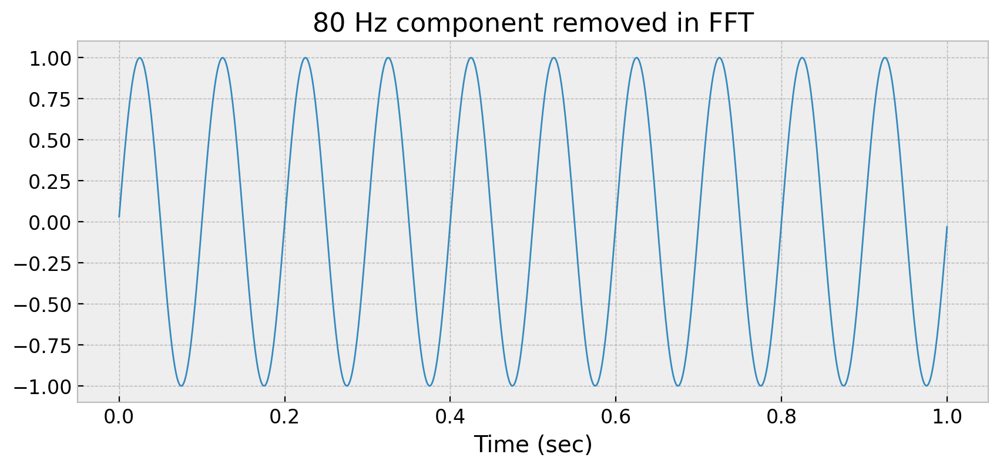

In [20]:
waveform_20_or_less = np.real(np.fft.ifft(fft_20_or_less))

plt.plot(time_sec, waveform_20_or_less)
plt.xlabel('Time (sec)')
plt.title('80 Hz component removed in FFT');

### Power spectrum

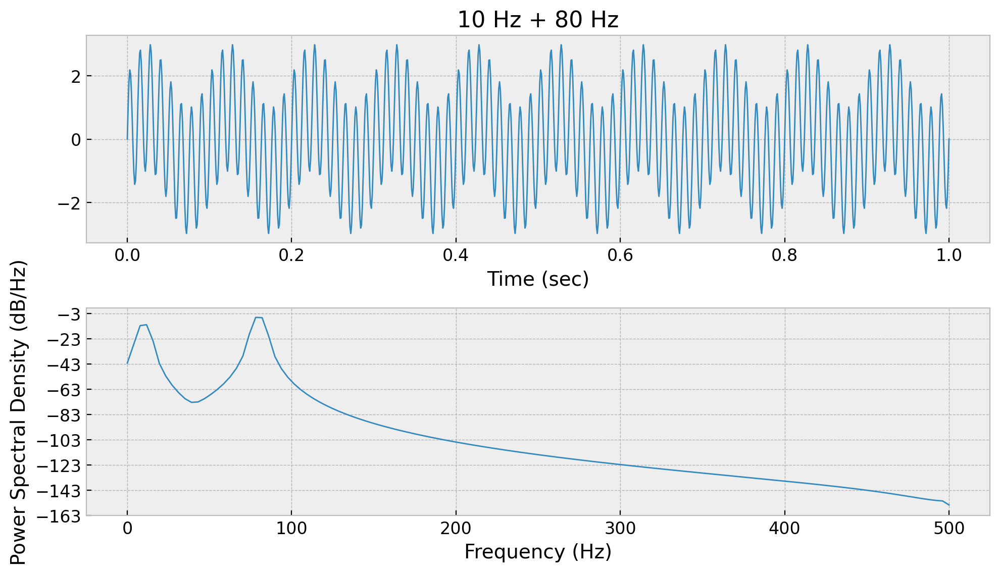

In [21]:
plt.figure(figsize=[10,8])
plt.subplot(3, 1, 1)
plt.plot(time_sec, waveform)
plt.xlabel('Time (sec)')
plt.title('10 Hz + 80 Hz')

plt.subplot(3, 1, 2)
sampleFreq_Hz = 1000
plt.psd(waveform, Fs=sampleFreq_Hz)
plt.xlabel('Frequency (Hz)')
plt.tight_layout();

*!!! It's up to you to get the units right in yor axis label.*

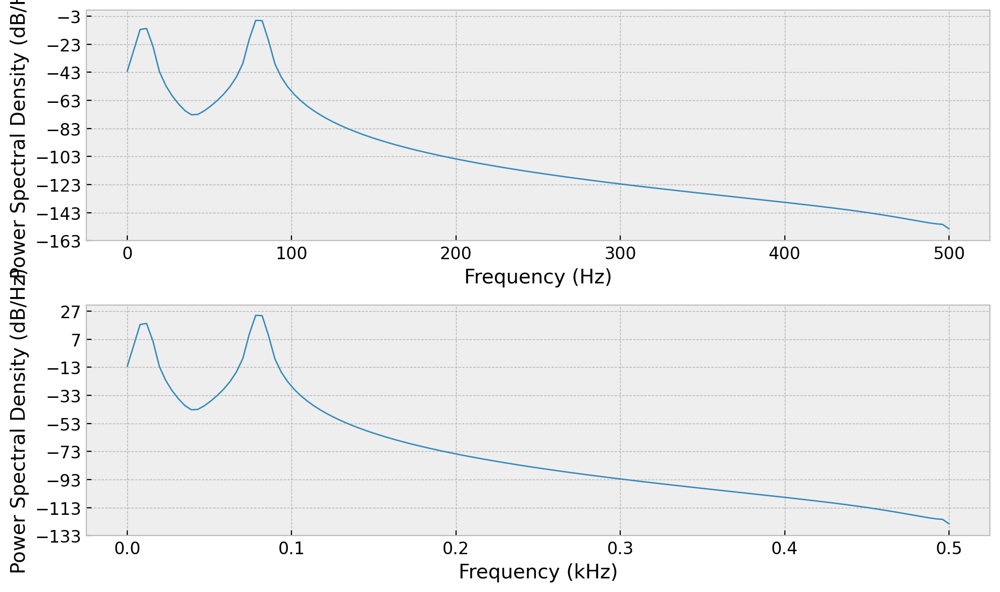

In [22]:
plt.figure(figsize=[10,6])
plt.subplot(2, 1, 1)
sampleFreq_Hz = 1000
plt.psd(waveform, Fs=sampleFreq_Hz)
plt.xlabel('Frequency (Hz)')

plt.subplot(2, 1, 2)
sampleFreq_kHz = 1
plt.psd(waveform, Fs=sampleFreq_kHz)
plt.xlabel('Frequency (kHz)')
plt.tight_layout();

Power spectrum for the 10 Hz and 80 Hz waveform undersampled at 50 Hz.

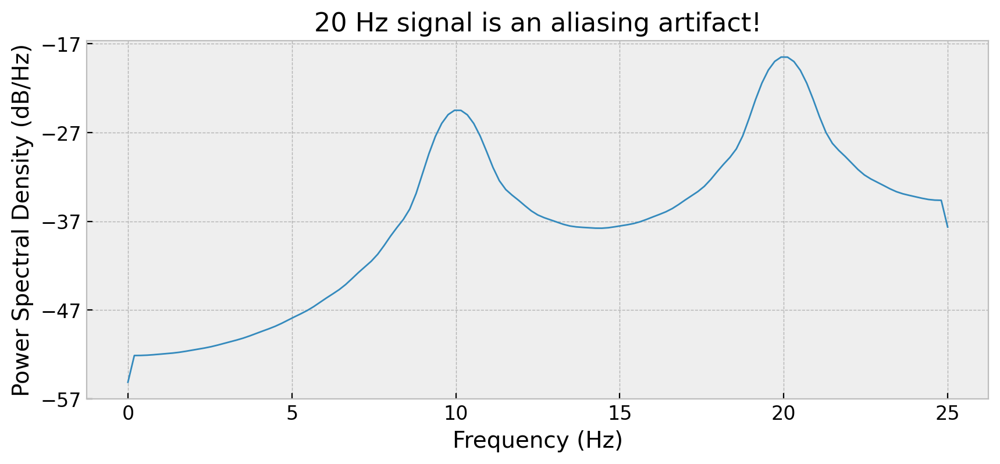

In [23]:
plt.psd(waveform[::20], Fs=50)
plt.xlabel('Frequency (Hz)')
plt.title('20 Hz signal is an aliasing artifact!');

### Spectrogram

<img src="images/spectrogram.png" width="70%">

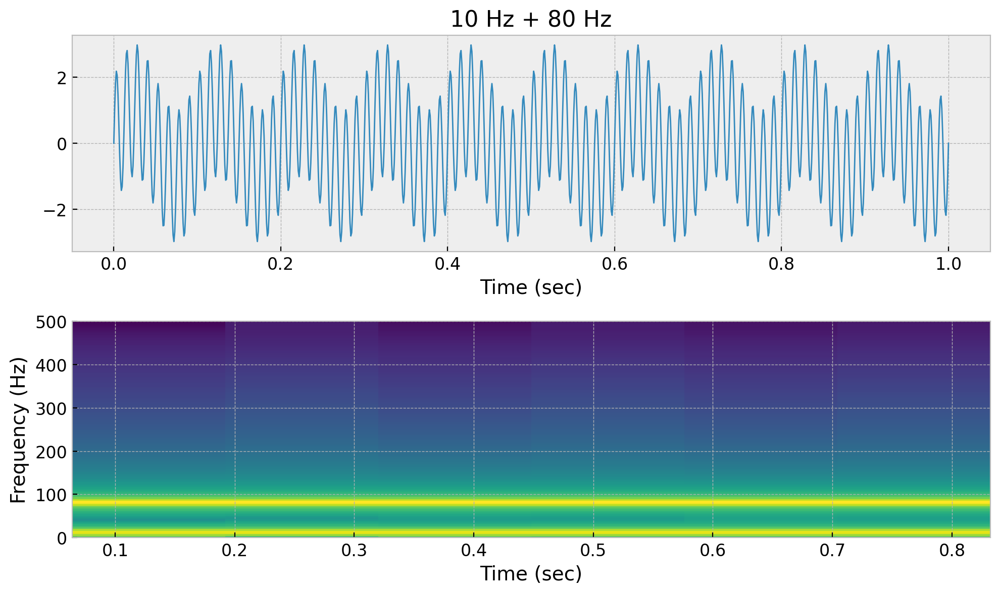

In [24]:
plt.figure(figsize=[10,6])
plt.subplot(2, 1, 1)
plt.plot(time_sec, waveform)
plt.xlabel('Time (sec)')
plt.title('10 Hz + 80 Hz')

plt.subplot(2, 1, 2)
plt.specgram(waveform, Fs=1000)
plt.xlabel('Time (sec)')
plt.ylabel('Frequency (Hz)')

plt.tight_layout();

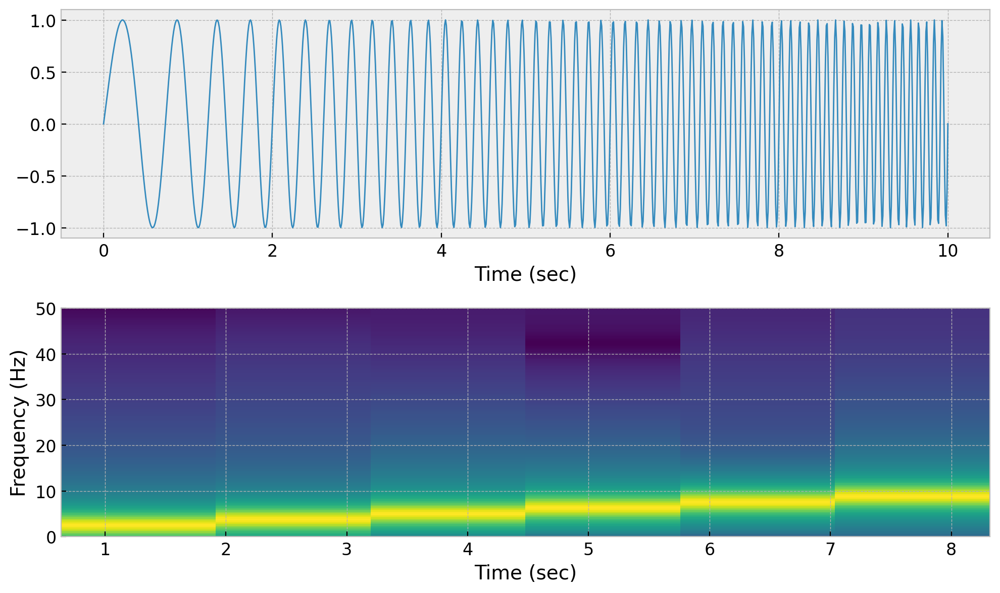

In [25]:
# chirp waveform
time_sec = np.linspace(0, 10, 1001)
chirp = np.sin(2 * np.pi * 1 * time_sec * (1 + 0.5 * time_sec))
chirpSampleFreq_Hz = 1 / (time_sec[1] - time_sec[0])

plt.figure(figsize=[10,6])
plt.subplot(2, 1, 1)
plt.plot(time_sec, chirp)
plt.xlabel('Time (sec)')

plt.subplot(2, 1, 2)
plt.specgram(chirp, Fs=chirpSampleFreq_Hz)
plt.xlabel('Time (sec)')
plt.ylabel('Frequency (Hz)')

plt.tight_layout();

### Convolution

In [26]:
import scipy.stats as st

input = np.zeros(1000)
input[500] = 1

impulse_response = st.expon.pdf(np.arange(150), 0, 20)
impulse_response /= impulse_response[0]

output  = np.convolve(input, impulse_response)

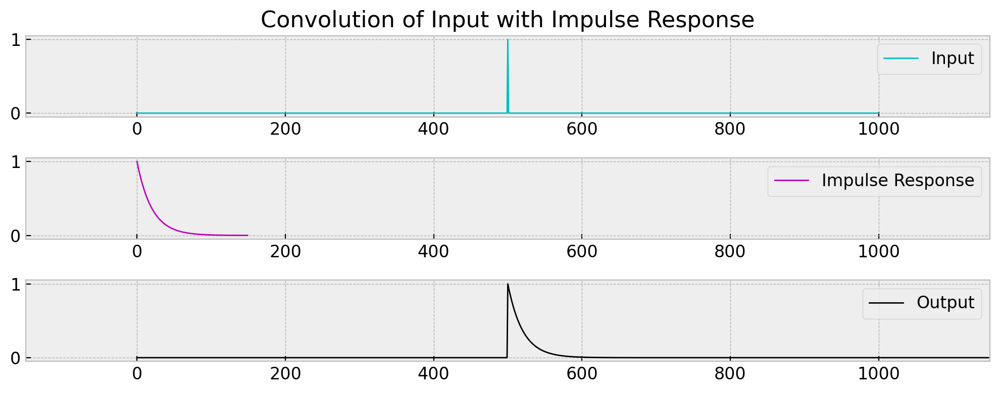

In [27]:
n_in = len(input)
n_ir = len(impulse_response)
xlim = [-n_ir, n_in + n_ir]
plt.subplot(3, 1, 1)
plt.plot(input, 'c', label="Input")
plt.xlim(xlim)
plt.legend()
plt.title("Convolution of Input with Impulse Response")
plt.subplot(3, 1, 2)
plt.plot(impulse_response, 'm', label="Impulse Response")
plt.xlim(xlim)
plt.legend()
plt.subplot(3, 1, 3)
plt.plot(output, 'k', label="Output")
plt.xlim(xlim)
plt.legend()
plt.tight_layout();

In [28]:
from ipywidgets import interact, IntSlider, Layout

def visualize_convolution(input, impulse_response):

    output  = np.convolve(input, impulse_response)

    def update_plot(t):
        n_in = len(input)
        n_ir = len(impulse_response)
        xlim = [-n_ir, n_in + n_ir]
        x = np.arange(n_ir)
        x = x - x[-1] + t
        plt.subplot(2, 1, 1)
        plt.plot(input, 'c', label="Input")
        plt.plot(x, np.flip(impulse_response), 'm', label="Reversed Impulse Response")
        plt.axvline(t, ls='--', color='m')
        if output[t] > 0:
            ind = np.where(input[x] > 0)[0]
            for i in ind:
                plt.plot(x[i], impulse_response[-(i+1)] * input[x[i]], 'o')
            overlap = np.zeros(output.shape)
            overlap[x] = np.flip(impulse_response)
            overlap[:n_in] *= input
            n_out = len(overlap)
            plt.fill_between(np.arange(n_out), np.zeros(n_out), overlap, alpha=0.5)
        plt.xlim(xlim)
        plt.legend()
        plt.title("Convolution of Input with Impulse Response")
        plt.subplot(2, 1, 2)
        plt.plot(output, 'k', label="Output")
        plt.axvline(t, ls='--', color='m')
        if output[t] > 0:
            ind = np.where(input[x] > 0)[0]
            y = 0
            for i in ind:
                dy = impulse_response[-(i+1)] * input[x[i]]
                markerline, stemlines, baseline = plt.stem(t, y + dy, bottom=y, linefmt='-')
                plt.setp(stemlines, 'color', plt.getp(markerline, 'color'))
                plt.setp(stemlines, 'linewidth', 2)
                y += dy
        plt.xlim(xlim)
        plt.legend()
        plt.tight_layout()

    tslider = IntSlider(value=0, min=0, max=1148, step=1, layout=Layout(width='100%'))
    interact(update_plot, t=tslider);

In [29]:
input = np.zeros(1000)
input[500] = 1

# Try uncommenting these lines one at a time to change the input:
# ---------------------------------------------------------------
# input[525] = 1
# input[540] = 1
# input[np.arange(500, 550, 5)] = 1
# input[500:550] = 1
# input[400:600] = st.norm.pdf(np.arange(-100, 100), 0, 20) / st.norm.pdf(0, 0, 20)
# input[400:600] = st.expon.pdf(np.arange(0, 200), 0, 30) / st.expon.pdf(0, 0, 30)

visualize_convolution(input, impulse_response)

interactive(children=(IntSlider(value=0, description='t', layout=Layout(width='100%'), max=1148), Output()), _…

<img src="images/convolve-discrete-1d.drawio.svg" width="70%">

<img src="images/convolve-multiply.png" width="70%">

### Filtering

If you convolved a seqeunce with the following uniform kernel, what would it do to the sequence?

In [30]:
uniform_kernel = np.ones(3) / 3

uniform_kernel

array([0.33333333, 0.33333333, 0.33333333])

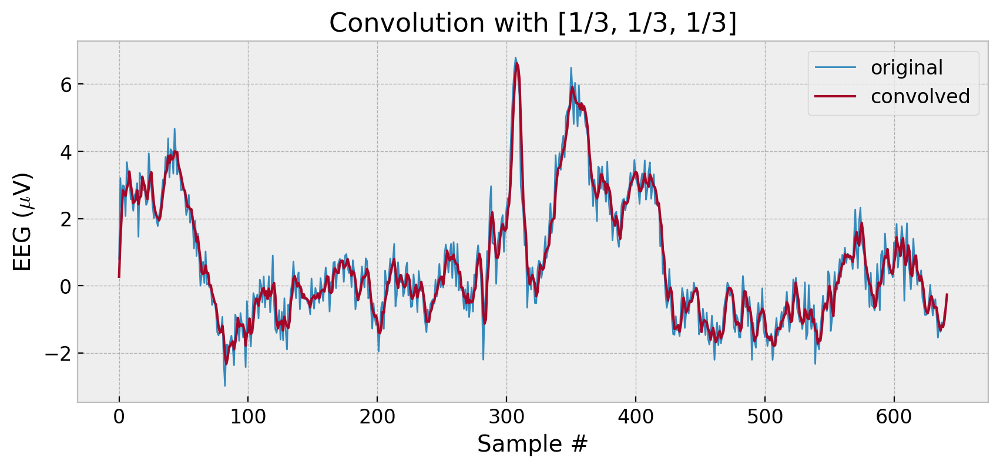

In [31]:
eeg = np.loadtxt('data/EEG.txt')

convolved_eeg = np.convolve(eeg, uniform_kernel)

plt.plot(eeg, label='original')
plt.plot(convolved_eeg, label='convolved', lw=1.5)
plt.xlabel('Sample #')
plt.ylabel(r'EEG ($\mu$V)')
plt.title('Convolution with [1/3, 1/3, 1/3]')
plt.legend();

### Question?

Which of the following kernels would take the average of every 5 points?

    A) [1, 1, 1, 1, 1]
    B) [0.2, 0.2, 0.2, 0.2, 0.2]
    C) [0.1, 0.2, 0.3, 0.2, 0.1]

If you convolved a seqeunce with the following gaussian kernel, how will the result differ from the uniform kernel?

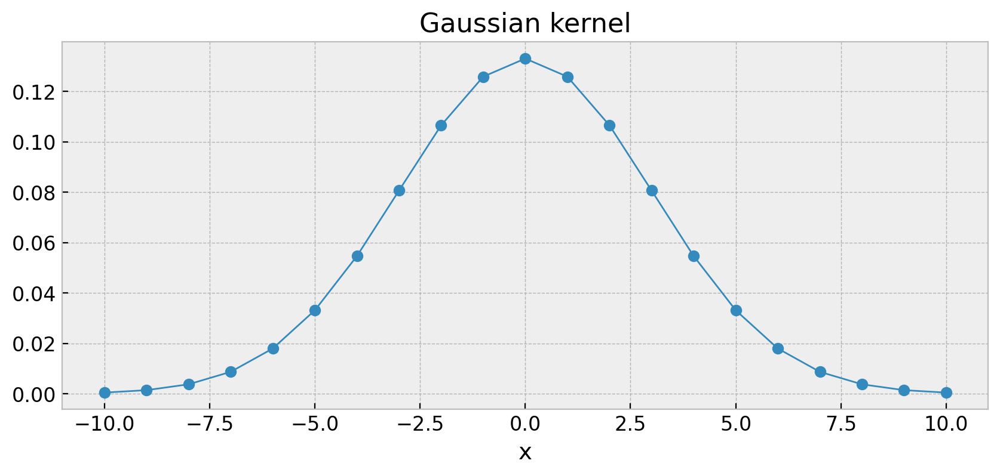

In [32]:
x = np.arange(-10, 11)
gauss_kernel = st.norm.pdf(x, 0, 3)

plt.plot(x, gauss_kernel, 'o-')
plt.xlabel('x')
plt.title('Gaussian kernel');

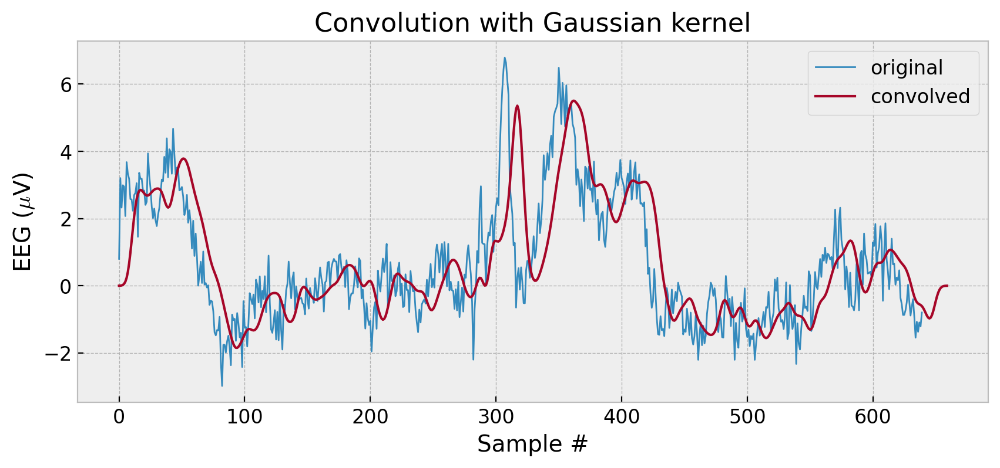

In [33]:
convolved_eeg = np.convolve(eeg, gauss_kernel)

plt.plot(eeg, label='original')
plt.plot(convolved_eeg, label='convolved', lw=1.5)
plt.xlabel('Sample #')
plt.ylabel(r'EEG ($\mu$V)')
plt.title('Convolution with Gaussian kernel')
plt.legend();

Because the convolution includes points where the kernel overhangs the sequence on either side, the convolution has more points than the sequence.

If we throw away points where the center of the kernel does NOT overlap the sequence, the apparent shift between the sequences is removed.

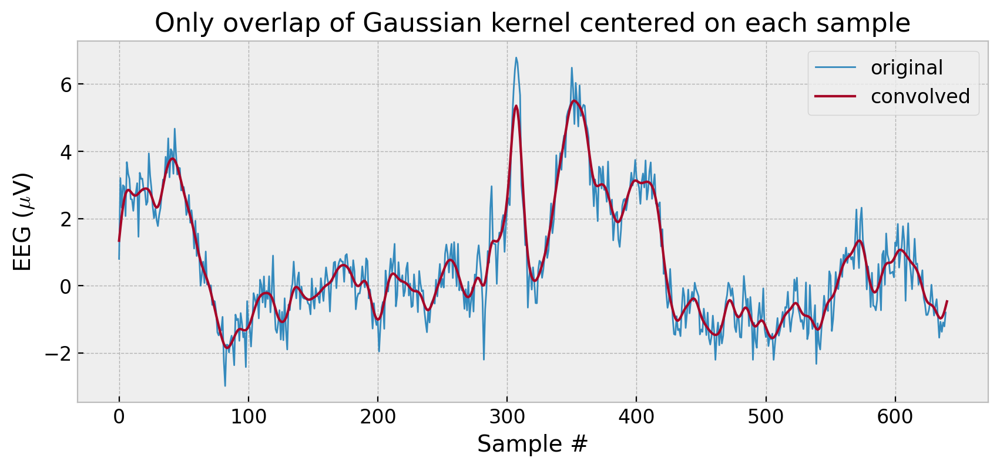

In [34]:
convolved_eeg = np.convolve(eeg, gauss_kernel)

plt.plot(eeg, label='original')
plt.plot(convolved_eeg[10:-9], label='convolved', lw=1.5)
plt.xlabel('Sample #')
plt.ylabel(r'EEG ($\mu$V)')
plt.title('Only overlap of Gaussian kernel centered on each sample')
plt.legend();

You can do the same thing with `mode='same'`

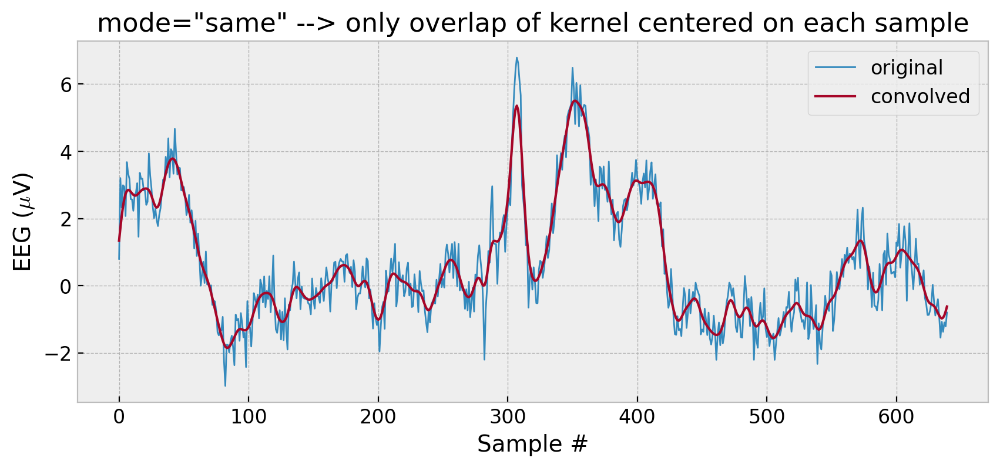

In [35]:
convolved_eeg = np.convolve(eeg, gauss_kernel, mode='same')

plt.plot(eeg, label='original')
plt.plot(convolved_eeg, label='convolved', lw=1.5)
plt.xlabel('Sample #')
plt.ylabel(r'EEG ($\mu$V)')
plt.title('mode="same" --> only overlap of kernel centered on each sample')
plt.legend();

Let's visualize a few different `mode` options...

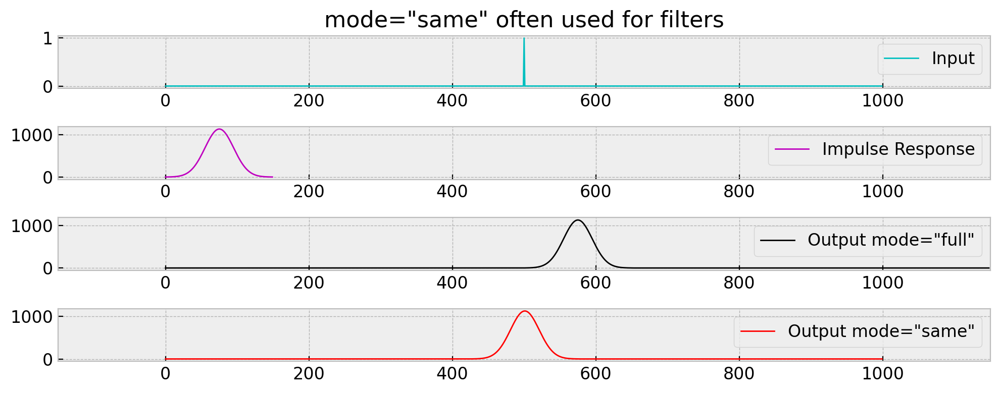

In [36]:
input = np.zeros(1000)
input[500] = 1

impulse_response = st.norm.pdf(np.arange(-75, 75), 0, 20)
impulse_response /= impulse_response[0]

output_full  = np.convolve(input, impulse_response)
output_same  = np.convolve(input, impulse_response, mode="same")

n_in = len(input)
n_ir = len(impulse_response)
xlim = [-n_ir, n_in + n_ir]
plt.subplot(4, 1, 1)
plt.plot(input, 'c', label="Input")
plt.xlim(xlim)
plt.legend()
plt.title('mode="same" often used for filters')
plt.subplot(4, 1, 2)
plt.plot(impulse_response, 'm', label="Impulse Response")
plt.xlim(xlim)
plt.legend()
plt.subplot(4, 1, 3)
plt.plot(output_full, 'k', label='Output mode="full"')
plt.xlim(xlim)
plt.legend()
plt.subplot(4, 1, 4)
plt.plot(output_same, 'r', label='Output mode="same"')
plt.xlim(xlim)
plt.legend()
plt.tight_layout();

Which `mode` to prefer depends on the shape of the convolving function...

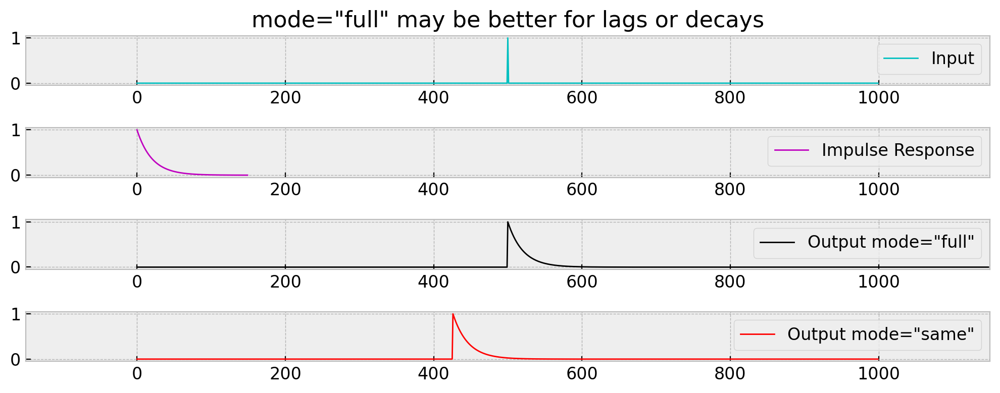

In [37]:
input = np.zeros(1000)
input[500] = 1

impulse_response = st.expon.pdf(np.arange(150), 0, 20)
impulse_response /= impulse_response[0]

output_full  = np.convolve(input, impulse_response)
output_same  = np.convolve(input, impulse_response, mode="same")

n_in = len(input)
n_ir = len(impulse_response)
xlim = [-n_ir, n_in + n_ir]
plt.subplot(4, 1, 1)
plt.plot(input, 'c', label="Input")
plt.xlim(xlim)
plt.legend()
plt.title('mode="full" may be better for lags or decays')
plt.subplot(4, 1, 2)
plt.plot(impulse_response, 'm', label="Impulse Response")
plt.xlim(xlim)
plt.legend()
plt.subplot(4, 1, 3)
plt.plot(output_full, 'k', label='Output mode="full"')
plt.xlim(xlim)
plt.legend()
plt.subplot(4, 1, 4)
plt.plot(output_same, 'r', label='Output mode="same"')
plt.xlim(xlim)
plt.legend()
plt.tight_layout();

### Finite impulse response (FIR) filters

Consider an EEG time series sampled at 0.25 kHz or 250 Hz.

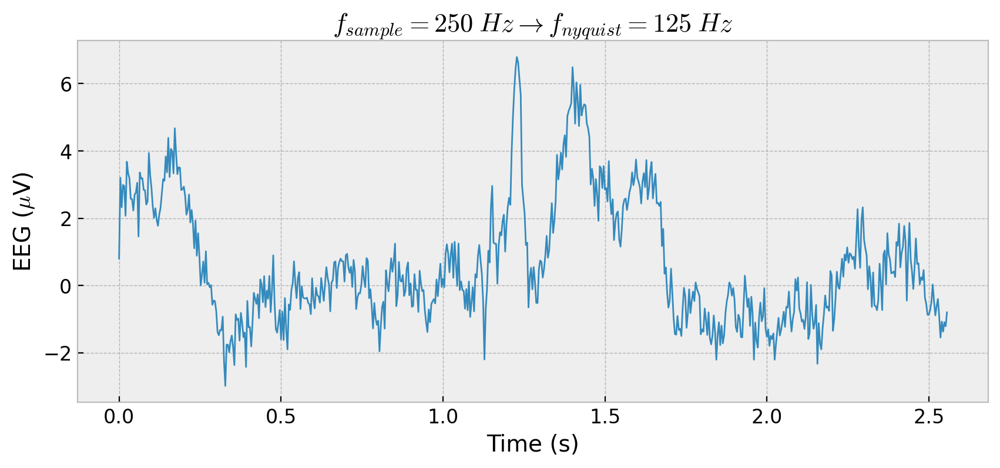

In [38]:
sampleFreq_Hz = 250

time_s = np.arange(len(eeg)) * (1.0 / sampleFreq_Hz)

plt.plot(time_s, eeg)
plt.xlabel('Time (s)')
plt.ylabel(r'EEG ($\mu$V)')
plt.title(r'$f_{sample} = 250 \; Hz \rightarrow f_{nyquist} = 125 \; Hz$');

### Lowpass filter

In [39]:
from scipy import signal

In [40]:
# Get rid of frequencies above 30 Hz
cutoffFreq_Hz = 30

# Use an odd number of taps (points in your filter kernel, e.g., 101)
# so that the kernel is centered on a point.
lowpass_filter_kernel = signal.firwin(101, cutoffFreq_Hz, fs=sampleFreq_Hz)

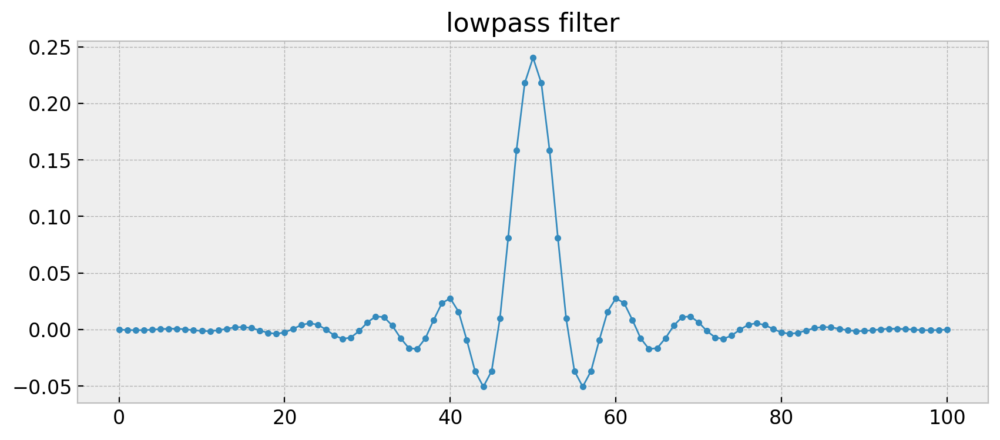

In [41]:
plt.plot(lowpass_filter_kernel, '.-')
plt.title('lowpass filter');

Now convolve the EEG with the low pass kernel to do the filtering...

In [42]:
lowpass_filtered_eeg = np.convolve(eeg, lowpass_filter_kernel, mode="same")

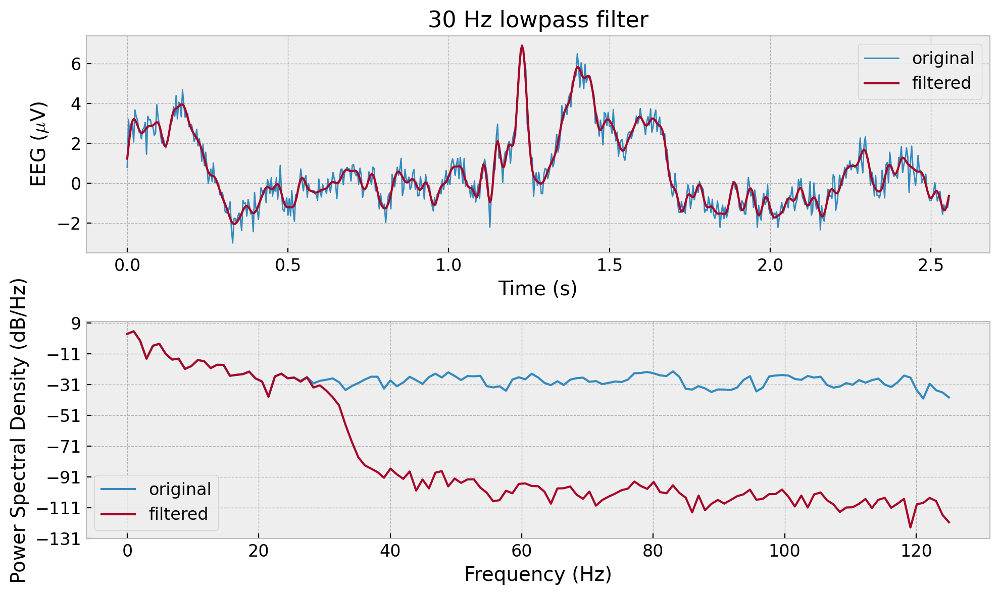

In [43]:
plt.figure(figsize=[10,6])
plt.subplot(2, 1, 1)
plt.plot(time_s, eeg, label='original')
plt.plot(time_s, lowpass_filtered_eeg, label='filtered', lw=1.5)
plt.xlabel('Time (s)')
plt.ylabel(r'EEG ($\mu$V)')
plt.title('30 Hz lowpass filter')
plt.legend()
plt.subplot(2, 1, 2)
plt.psd(eeg, Fs=sampleFreq_Hz, label='original', lw=1.5)
plt.psd(lowpass_filtered_eeg, Fs=sampleFreq_Hz, label='filtered', lw=1.5)
plt.xlabel('Frequency (Hz)')
plt.legend()
plt.tight_layout();

How many taps should you use for your filter kernel?

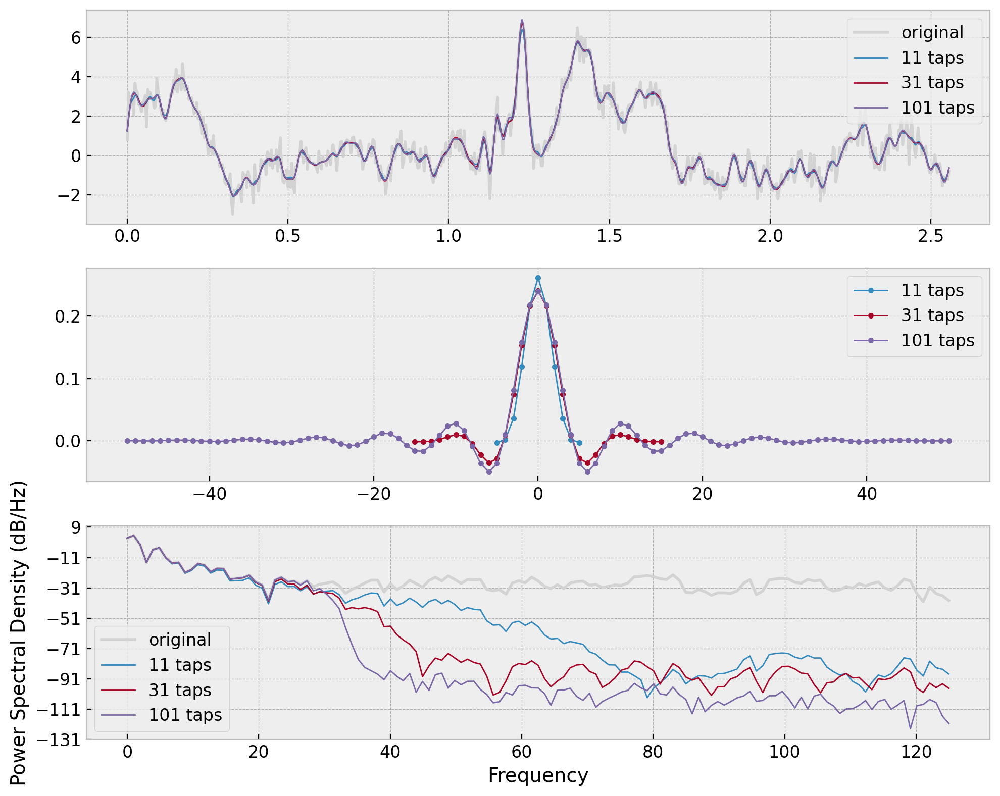

In [44]:
plt.figure(figsize=[10,8])
plt.subplot(3, 1, 1)
plt.plot(time_s, eeg, c='lightgray', label='original', lw=2)
plt.subplot(3, 1, 3)
plt.psd(eeg, Fs=sampleFreq_Hz, c='lightgray', label='original', lw=2)
for n_taps in [11, 31, 101]:
    lowpass_filter_kernel = signal.firwin(n_taps, cutoffFreq_Hz, fs=sampleFreq_Hz)
    lowpass_filtered_eeg = np.convolve(eeg, lowpass_filter_kernel, mode="same")
    plt.subplot(3, 1, 1)
    plt.plot(time_s, lowpass_filtered_eeg, label=f"{n_taps} taps")
    plt.subplot(3, 1, 2)
    plt.plot(np.arange(n_taps) - (n_taps-1)/2, lowpass_filter_kernel, '.-', label=f"{n_taps} taps")
    plt.subplot(3, 1, 3)
    plt.psd(lowpass_filtered_eeg, Fs=sampleFreq_Hz, label=f"{n_taps} taps")
plt.subplot(3, 1, 1)
plt.legend()
plt.subplot(3, 1, 2)
plt.legend()
plt.subplot(3, 1, 3)
plt.legend()
plt.tight_layout();

### Highpass filter

In [45]:
# Get rid of frequencies below 10 Hz
cutoffFreq_Hz = 10

# Use an odd number of taps (points in your filter kernel, e.g., 301)
# so that the kernel is centered on a point.
highpass_filter_kernel = signal.firwin(301, cutoffFreq_Hz, fs=sampleFreq_Hz, pass_zero=False)

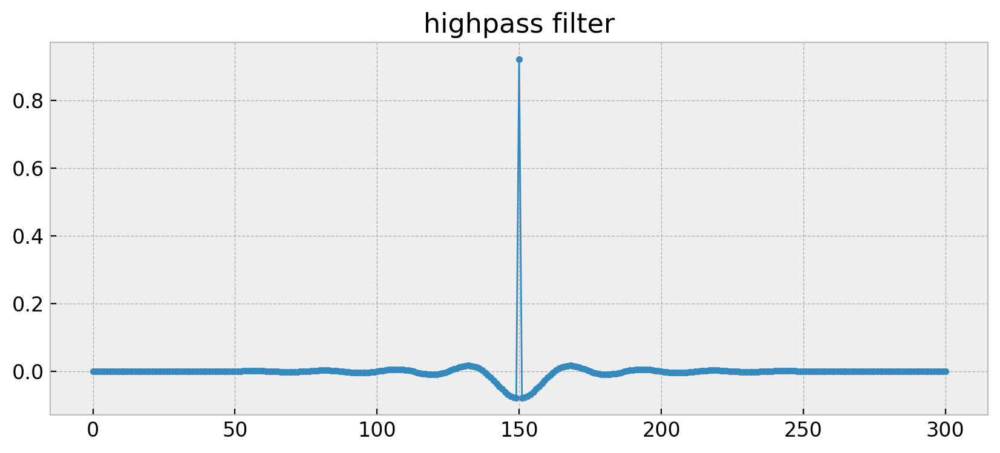

In [46]:
plt.plot(highpass_filter_kernel, '.-')
plt.title('highpass filter');

In [47]:
highpass_filtered_eeg = np.convolve(eeg, highpass_filter_kernel, mode="same")

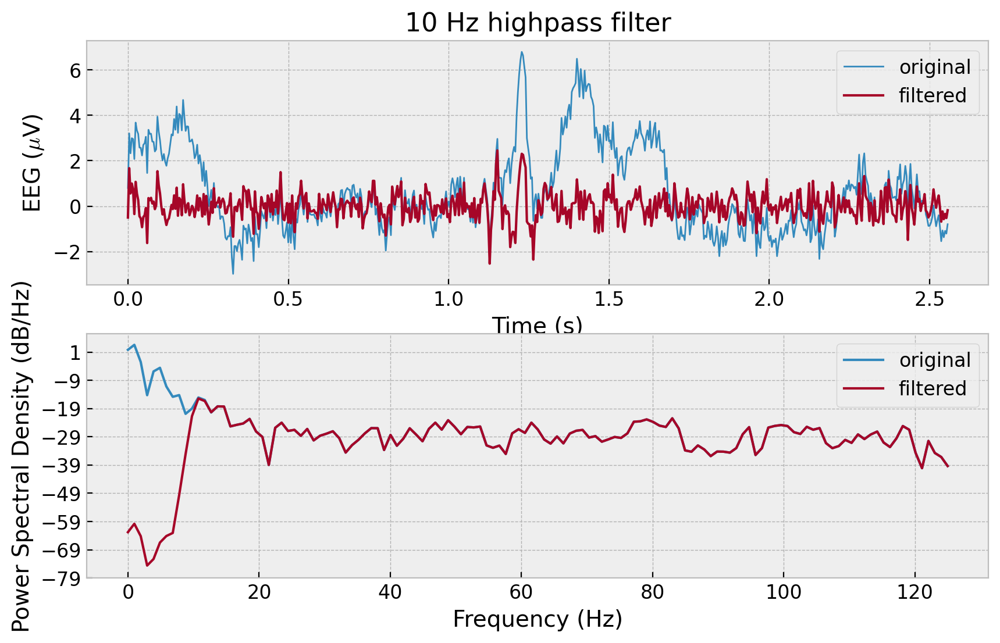

In [48]:
plt.figure(figsize=[10,6])
plt.subplot(2, 1, 1)
plt.plot(time_s, eeg, label='original')
plt.plot(time_s, highpass_filtered_eeg, label='filtered', lw=1.5)
plt.xlabel('Time (s)')
plt.ylabel(r'EEG ($\mu$V)')
plt.title('10 Hz highpass filter')
plt.legend()
plt.subplot(2, 1, 2)
plt.psd(eeg, Fs=sampleFreq_Hz, label='original', lw=1.5)
plt.psd(highpass_filtered_eeg, Fs=sampleFreq_Hz, label='filtered', lw=1.5)
plt.xlabel('Frequency (Hz)')
plt.legend();

### Bandpass filter

In [49]:
# Get rid of frequencies outside of the range 10-30 Hz
bandpassFreq_Hz = [10, 30]

# Use an odd number of taps (points in your filter kernel, e.g., 301)
# so that the kernel is centered on a point.
bandpass_filter_kernel = signal.firwin(301, bandpassFreq_Hz, fs=sampleFreq_Hz, pass_zero=False)

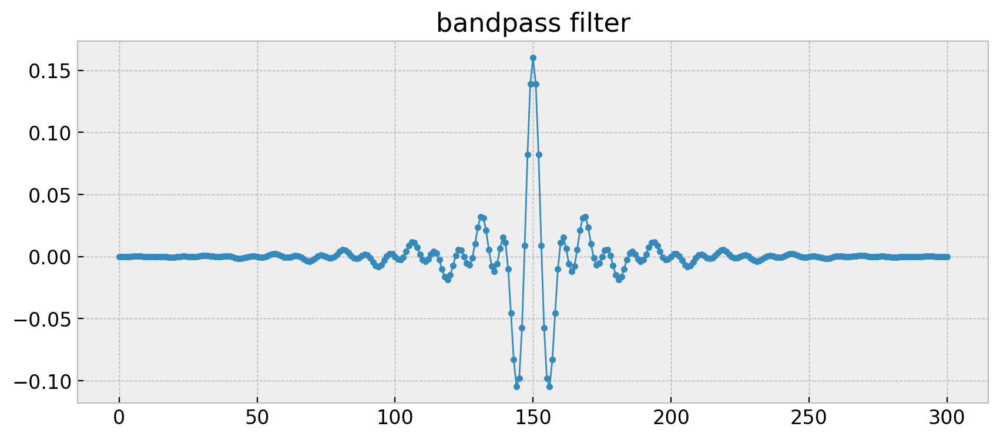

In [50]:
plt.plot(bandpass_filter_kernel, '.-')
plt.title('bandpass filter');

In [51]:
bandpass_filtered_eeg = np.convolve(eeg, bandpass_filter_kernel, mode="same")

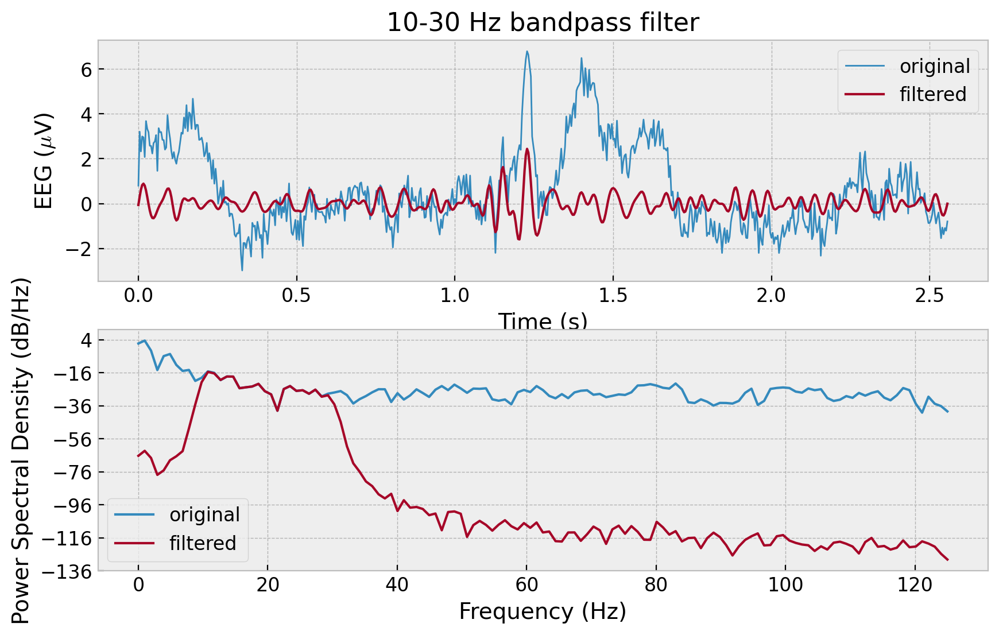

In [52]:
plt.figure(figsize=[10,6])
plt.subplot(2, 1, 1)
plt.plot(time_s, eeg, label='original')
plt.plot(time_s, bandpass_filtered_eeg, label='filtered', lw=1.5)
plt.xlabel('Time (s)')
plt.ylabel(r'EEG ($\mu$V)')
plt.title('10-30 Hz bandpass filter')
plt.legend()
plt.subplot(2, 1, 2)
plt.psd(eeg, Fs=sampleFreq_Hz, label='original', lw=1.5)
plt.psd(bandpass_filtered_eeg, Fs=sampleFreq_Hz, label='filtered', lw=1.5)
plt.xlabel('Frequency (Hz)')
plt.legend();

We only touched on a few of the many options that exist for filtering.

See https://docs.scipy.org/doc/scipy-0.17.1/reference/signal.html for more options within scipy.signal.

### Downsampling (without aliasing artifacts)

Consider a simple waveform composed of 10 Hz and 80 Hz signals that we sampled at 1000 Hz.

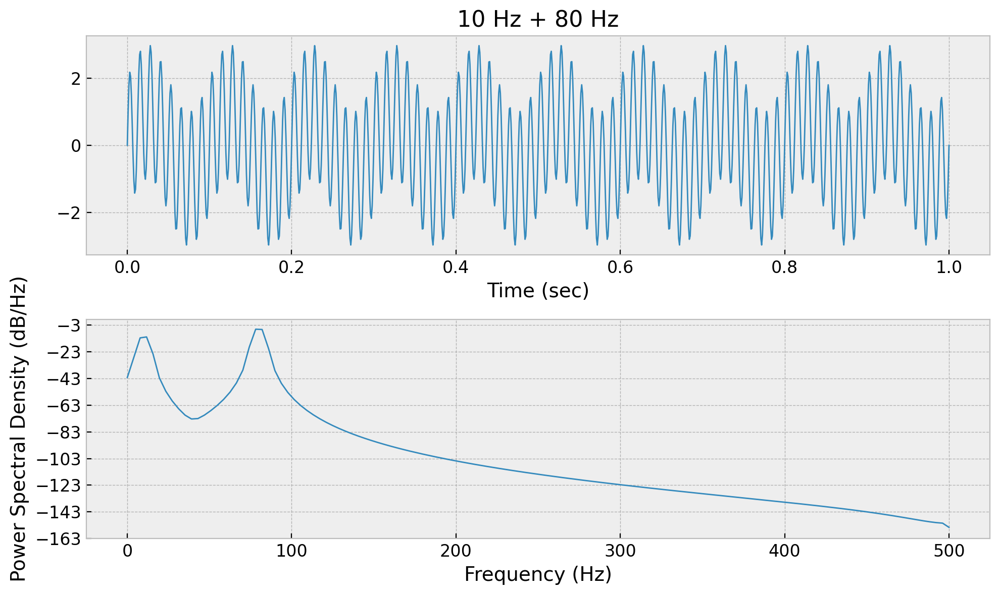

In [53]:
sampleFreq_Hz = 1000
time_sec = np.arange(0, 1.001, 1.0 / sampleFreq_Hz)
waveform = np.sin(2 * np.pi * 10 * time_sec) + 2 * np.sin(2 * np.pi * 80 * time_sec)

plt.figure(figsize=[10,6])
plt.subplot(2, 1, 1)
plt.plot(time_sec, waveform)
plt.xlabel('Time (sec)')
plt.title('10 Hz + 80 Hz')
plt.subplot(2, 1, 2)
plt.psd(waveform, Fs=sampleFreq_Hz)
plt.xlabel('Frequency (Hz)')
plt.tight_layout();

What's the slowest sample freqeuncy you could record this 10 Hz + 80 Hz signal at without introducing aliasing artifacts?

What if you simply took every 20th data point to downsample the signal to a sample frequency of 50 Hz?

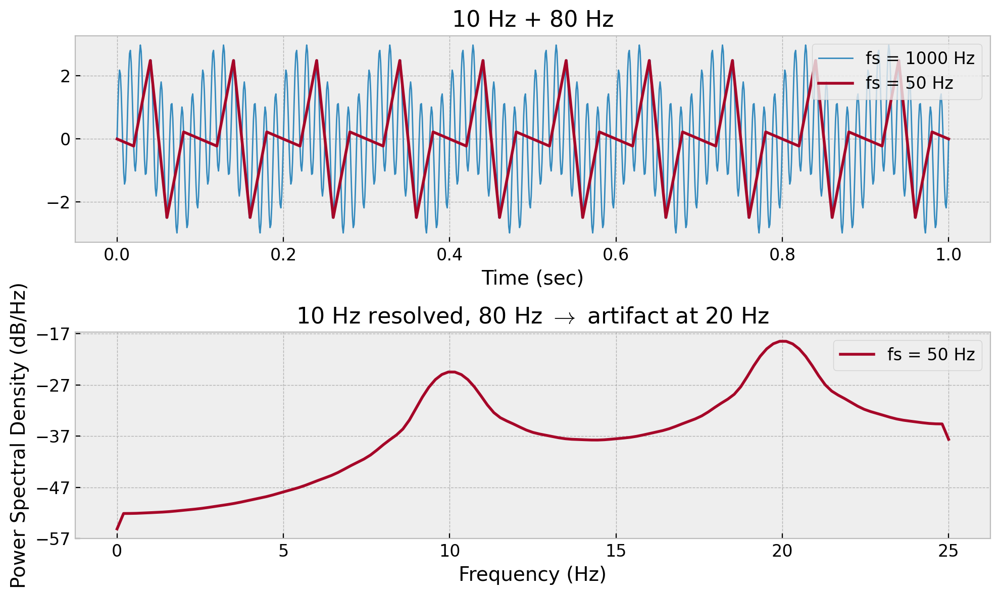

In [54]:
plt.figure(figsize=[10,6])
plt.subplot(2, 1, 1)
plt.plot(time_sec, waveform, label='fs = 1000 Hz')
plt.plot(time_sec[::20], waveform[::20], label='fs = 50 Hz', lw=2)
plt.xlabel('Time (sec)')
plt.title('10 Hz + 80 Hz')
plt.legend()
plt.subplot(2, 1, 2)
plt.plot([])
plt.psd(waveform[::20], Fs=sampleFreq_Hz/20, label='fs = 50 Hz', lw=2)
plt.xlabel('Frequency (Hz)')
plt.title(r'10 Hz resolved, 80 Hz $\rightarrow$ artifact at 20 Hz')
plt.legend()
plt.tight_layout();

But what if you only care about the 10 Hz component and you want to store your data at a sample rate of 50 Hz?

Well, the problem is that at a sample rate of 50 Hz you can only resolve frequencies up to 25 Hz, so faster freqeuncies such as 80 Hz appear as artifacts.

What if before you downsampled you simply got rid of all the frequencies that could produce an artifact at a sample rate of 50 Hz?

i.e., first lowpass filter at 25 Hz, then downsample to 50 Hz.

In [55]:
lowpass = signal.firwin(301, 25, fs=sampleFreq_Hz)
lowpass_waveform = np.convolve(waveform, lowpass, 'same')
downsampled_waveform = lowpass_waveform[::20]

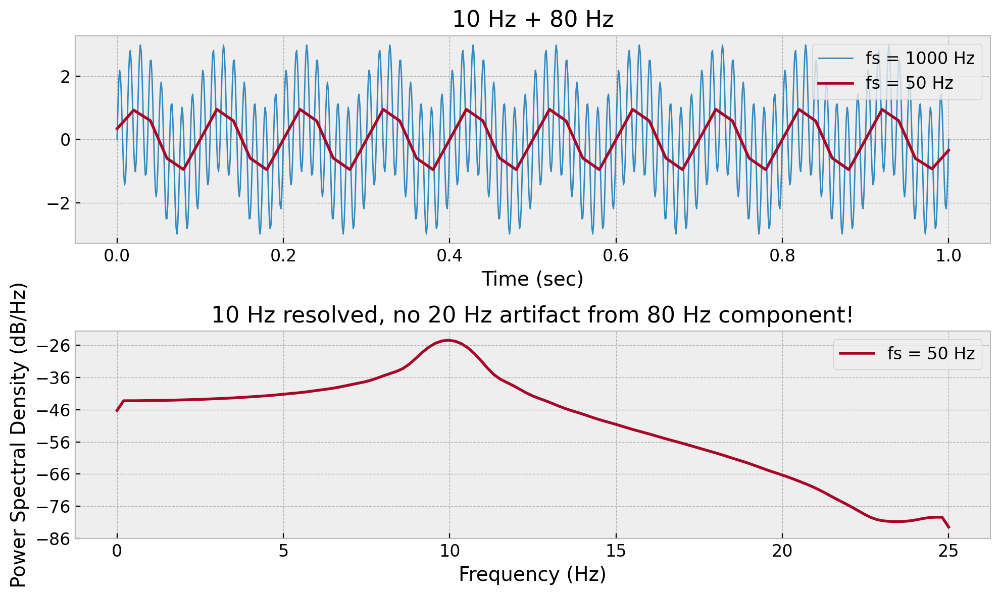

In [56]:
plt.figure(figsize=[10,6])
plt.subplot(2, 1, 1)
plt.plot(time_sec, waveform, label='fs = 1000 Hz')
plt.plot(time_sec[::20], downsampled_waveform, label='fs = 50 Hz', lw=2)
plt.xlabel('Time (sec)')
plt.title('10 Hz + 80 Hz')
plt.legend()
plt.subplot(2, 1, 2)
plt.plot([])
plt.psd(downsampled_waveform, Fs=sampleFreq_Hz/20, label='fs = 50 Hz', lw=2)
plt.xlabel('Frequency (Hz)')
plt.title('10 Hz resolved, no 20 Hz artifact from 80 Hz component!')
plt.legend()
plt.tight_layout();

`signal.decimate` makes this oh so easy...

In [57]:
# downsample every 20th data point (i.e. to 50 Hz)
downsampled_waveform = signal.decimate(waveform, 20)

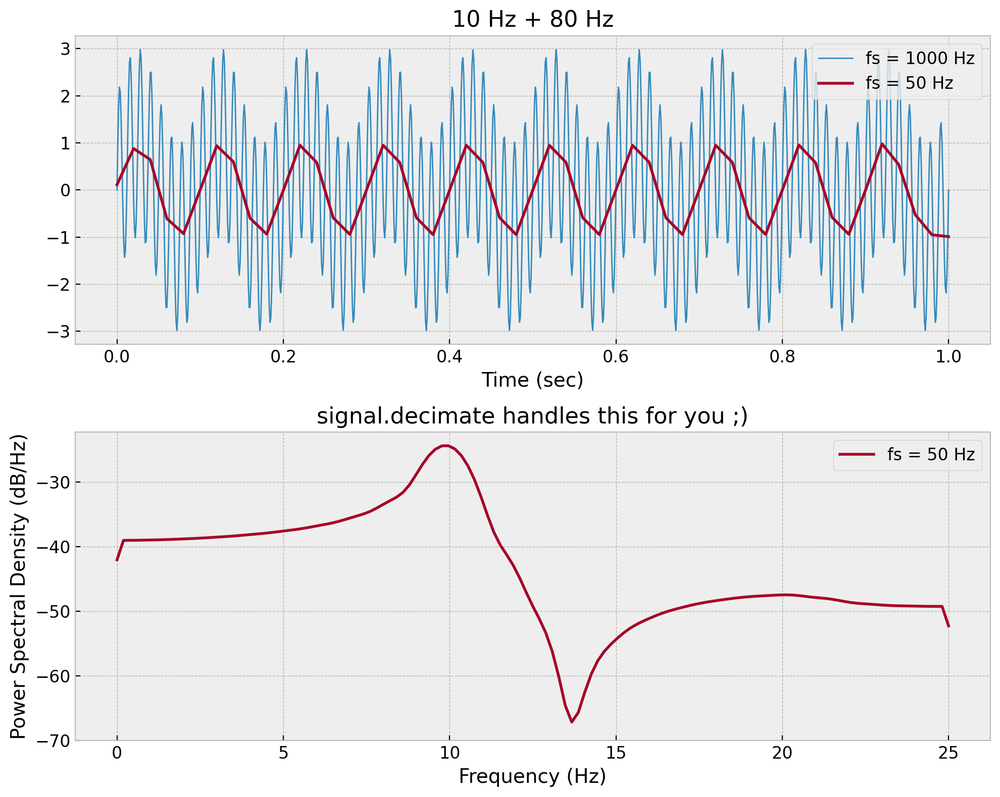

In [58]:
plt.figure(figsize=[10,8])
plt.subplot(2, 1, 1)
plt.plot(time_sec, waveform, label='fs = 1000 Hz')
plt.plot(time_sec[::20], downsampled_waveform, label='fs = 50 Hz', lw=2)
plt.xlabel('Time (sec)')
plt.title('10 Hz + 80 Hz')
plt.legend()
plt.subplot(2, 1, 2)
plt.plot([])
plt.psd(downsampled_waveform, Fs=sampleFreq_Hz/20, label='fs = 50 Hz', lw=2)
plt.xlabel('Frequency (Hz)')
plt.title('signal.decimate handles this for you ;)')
plt.legend()
plt.tight_layout();

Subsampling and aliasing in 2D images.

<img src="images/image-aliasing.png" width="70%">

Image from Alex Huth's lecture slides.

### Convolution in 2D

<img src="images/image-convolution.png" width="50%">

[scikit-image](https://scikit-image.org)

```
pip install scikit-image
```

In [59]:
from skimage.io import imread

In [60]:
im = imread('images/neurons.jpg')

im.shape, im.dtype

((256, 512, 3), dtype('uint8'))

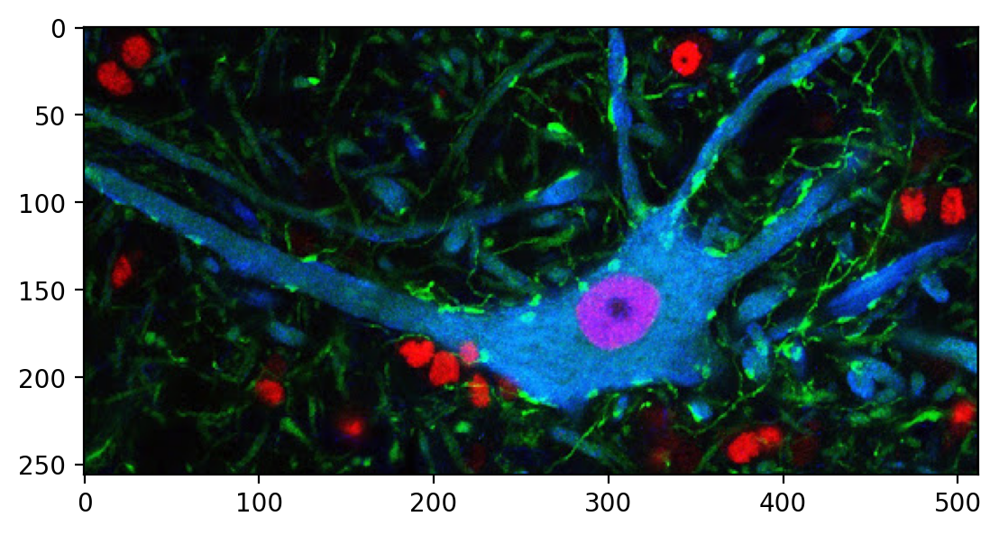

In [61]:
plt.style.use('default')
plt.imshow(im);

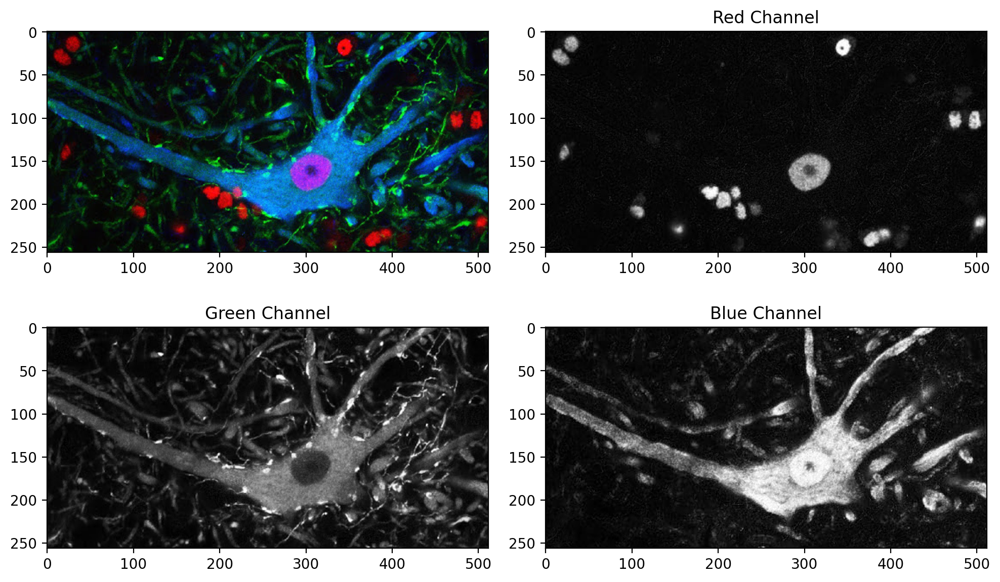

In [62]:
plt.figure(figsize=[10,6])
plt.subplot(2,2,1)
plt.imshow(im)
plt.subplot(2,2,2)
plt.imshow(im[:,:,0], cmap='gray')
plt.title('Red Channel')
plt.subplot(2,2,3)
plt.imshow(im[:,:,1], cmap='gray')
plt.title('Green Channel')
plt.subplot(2,2,4)
plt.imshow(im[:,:,2], cmap='gray')
plt.title('Blue Channel')
plt.tight_layout();

Blur the image in the green channel by averaging all pixels within a 5x5 sqaure.

In [63]:
uniform_kernel2d = np.ones([5,5]) / 25

uniform_kernel2d

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]])

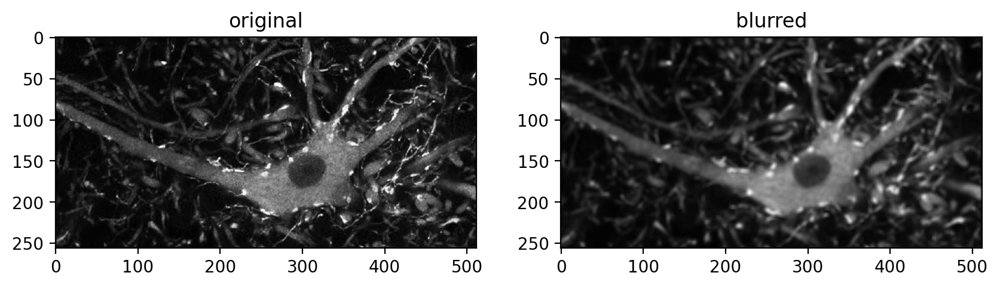

In [64]:
from scipy import ndimage

green = im[:,:,1]

green_blurred = ndimage.convolve(green, uniform_kernel2d)

plt.figure(figsize=[10,3])
plt.subplot(1,2,1)
plt.imshow(green, cmap='gray')
plt.title('original')
plt.subplot(1,2,2)
plt.imshow(green_blurred, cmap='gray')
plt.title('blurred');

Gaussian blur in 2D

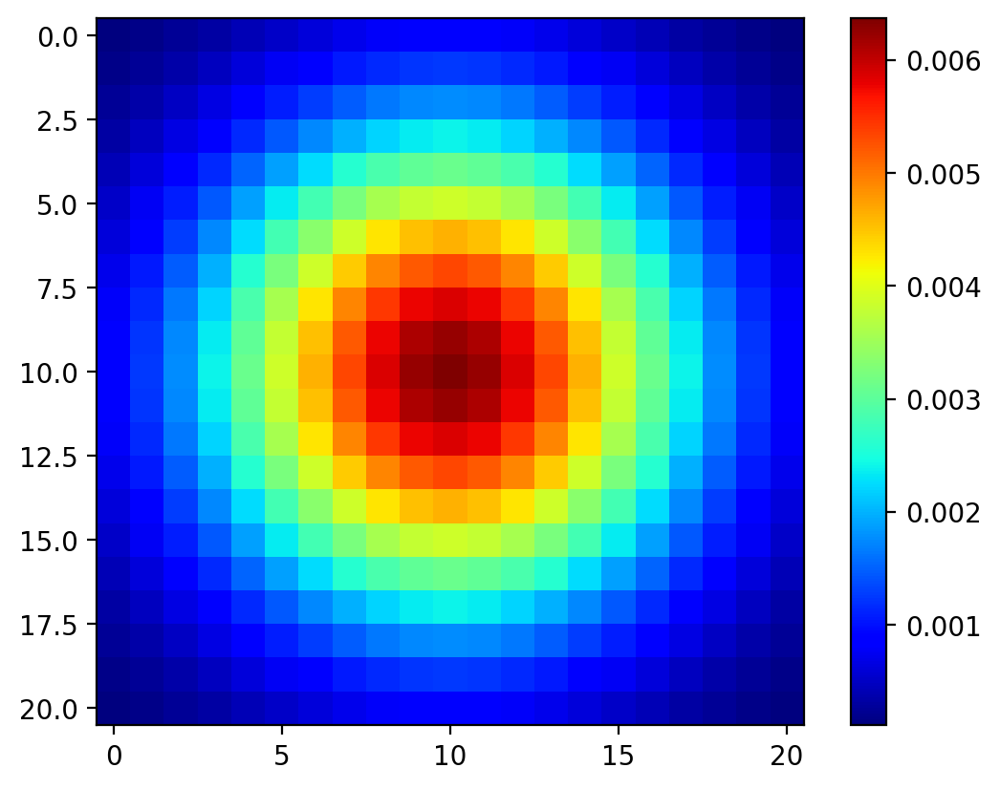

In [65]:
gauss_kernel1d = st.norm.pdf(np.arange(-10, 11), 0, 5)

row = gauss_kernel1d.reshape((1,-1))  # 1 x 21 row vector
col = gauss_kernel1d.reshape((-1,1))  # 21 x 1 column vector

gauss_kernel2d = col @ row  # 21 x 21 matrix

plt.imshow(gauss_kernel2d, cmap='jet')
plt.colorbar();

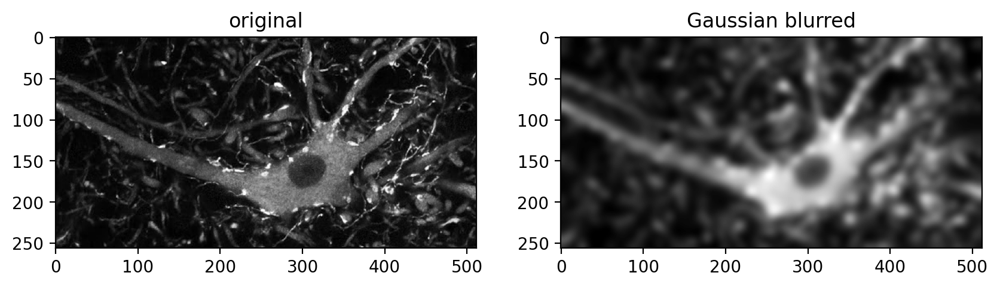

In [66]:
green_blurred = ndimage.convolve(green, gauss_kernel2d)

plt.figure(figsize=[10,3])
plt.subplot(1,2,1)
plt.imshow(green, cmap='gray')
plt.title('original')
plt.subplot(1,2,2)
plt.imshow(green_blurred, cmap='gray')
plt.title('Gaussian blurred');

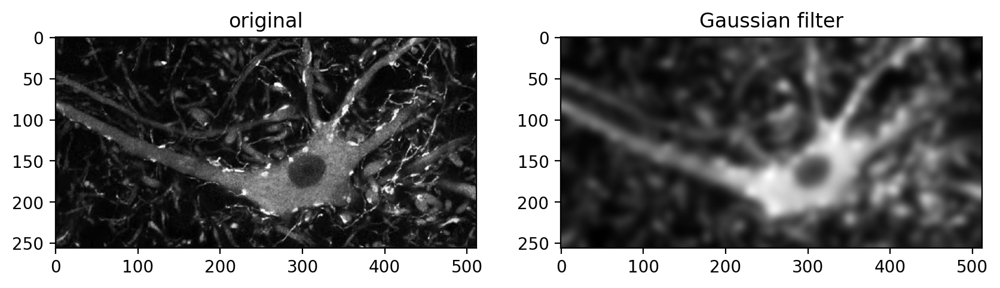

In [67]:
green_blurred = ndimage.gaussian_filter(green, sigma=5)

plt.figure(figsize=[10,3])
plt.subplot(1,2,1)
plt.imshow(green, cmap='gray')
plt.title('original')
plt.subplot(1,2,2)
plt.imshow(green_blurred, cmap='gray')
plt.title('Gaussian filter');

So much more than just blurring ;)

See more examples of image convolution at https://aishack.in/tutorials/image-convolution-examples/

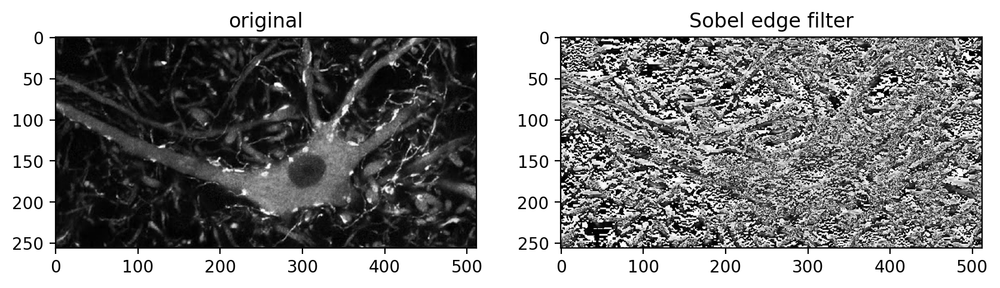

In [68]:
edge_kernel = np.array([
    [-1, -2, -1],
    [0, 0, 0],
    [1, 2, 1]
])

# convolve green image with edge kernel
green_edges = ndimage.convolve(green, edge_kernel)

plt.figure(figsize=[10,3])
plt.subplot(1,2,1)
plt.imshow(green, cmap='gray')
plt.title('original')
plt.subplot(1,2,2)
plt.imshow(green_edges, cmap='gray')
plt.title('Sobel edge filter');

### Joint Probability

P(A,B) = P(A) P(B)

<img src="images/dice.jpg">

**The joint probability distribution resulting from adding two random variables is the convolution of their individual probability distributions.**

An interesting explanation of convolutions related to probability distributions: http://colah.github.io/posts/2014-07-Understanding-Convolutions/

In [69]:
plt.style.use("bmh")
plt.rcParams["axes.labelsize"] = 18
plt.rcParams["axes.titlesize"] = 20
plt.rcParams["xtick.labelsize"] = 12
plt.rcParams["ytick.labelsize"] = 12
plt.rcParams["legend.fontsize"] = 12
plt.rcParams["lines.linewidth"] = 1
plt.rcParams["figure.figsize"] = 10, 4

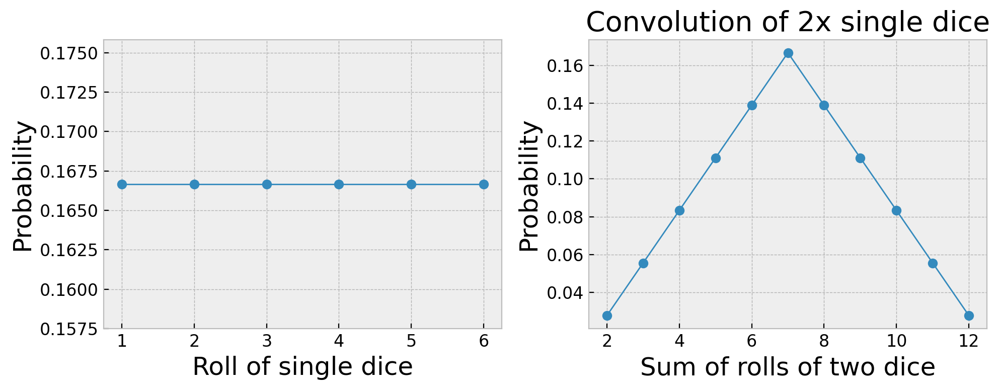

In [70]:
# 6 sided dice with equal probability for each number
roll_1 = np.arange(1,7)
prob_1 = np.ones(6) / 6

roll_2 = np.arange(2,13)
prob_2 = signal.convolve(prob_1, prob_1)

plt.subplot(1,2,1)
plt.plot(roll_1, prob_1, 'o-')
plt.xlabel('Roll of single dice')
plt.ylabel('Probability')
plt.subplot(1,2,2)
plt.plot(roll_2, prob_2, 'o-')
plt.xlabel('Sum of rolls of two dice')
plt.ylabel('Probability')
plt.title('Convolution of 2x single dice')
plt.tight_layout();